In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv('../datasets/no1_aggregated/no1_2020_to_2022_aggregated.csv')
df.head()

,start MTU (UTC),end MTU (UTC),Day-ahead Price [EUR/MWh] BZN|NO1,Day-ahead Price [EUR/MWh] BZN|NO2,Day-ahead Price [EUR/MWh] BZN|NO3,Day-ahead Price [EUR/MWh] BZN|NO5,Day-ahead Price [EUR/MWh] BZN|SE3,Actual Total Load [MW] - BZN|NO1,Actual Total Load [MW] - BZN|NO2,Actual Total Load [MW] - BZN|NO3,...,CBF BZN|NO1 > BZN|NO3 [MW],CBF BZN|NO5 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|NO5 [MW],CBF BZN|SE3 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|SE3 [MW],Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|NO1,Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|NO2,Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|NO3,Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|NO5,Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|SE3
0,2020-01-01 00:00:00,2020-01-01 01:00:00,31.77,31.77,28.45,31.77,28.45,4333.0,4139.0,3016.0,...,0.0,1449.0,0.0,391,0,4012000.0,24273000.0,5588000.0,11211000.0,2220000.0
1,2020-01-01 01:00:00,2020-01-01 02:00:00,31.57,31.57,27.90,31.57,27.90,4250.0,4114.0,2945.0,...,0.0,1283.0,0.0,348,0,4012000.0,24273000.0,5588000.0,11211000.0,2220000.0
2,2020-01-01 02:00:00,2020-01-01 03:00:00,31.28,31.28,27.52,31.28,27.52,4167.0,4030.0,3032.0,...,6.0,962.0,0.0,500,0,4012000.0,24273000.0,5588000.0,11211000.0,2220000.0
3,2020-01-01 03:00:00,2020-01-01 04:00:00,30.72,30.72,27.54,30.72,27.54,4145.0,4032.0,2988.0,...,6.0,767.0,0.0,610,0,4012000.0,24273000.0,5588000.0,11211000.0,2220000.0
4,2020-01-01 04:00:00,2020-01-01 05:00:00,30.27,30.27,26.55,30.27,26.55,4222.0,4032.0,2848.0,...,22.0,642.0,0.0,909,0,4012000.0,24273000.0,5588000.0,11211000.0,2220000.0


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26304 entries, 0 to 26303
Data columns (total 58 columns):
 #   Column                                                                         Non-Null Count  Dtype  
---  ------                                                                         --------------  -----  
 0   start MTU (UTC)                                                                26304 non-null  object 
 1   end MTU (UTC)                                                                  26304 non-null  object 
 2   Day-ahead Price [EUR/MWh] BZN|NO1                                              26304 non-null  float64
 3   Day-ahead Price [EUR/MWh] BZN|NO2                                              26304 non-null  float64
 4   Day-ahead Price [EUR/MWh] BZN|NO3                                              26304 non-null  float64
 5   Day-ahead Price [EUR/MWh] BZN|NO5                                              26304 non-null  float64
 6   Day-ahead Price [EUR/M

In [4]:
df.describe()

,Day-ahead Price [EUR/MWh] BZN|NO1,Day-ahead Price [EUR/MWh] BZN|NO2,Day-ahead Price [EUR/MWh] BZN|NO3,Day-ahead Price [EUR/MWh] BZN|NO5,Day-ahead Price [EUR/MWh] BZN|SE3,Actual Total Load [MW] - BZN|NO1,Actual Total Load [MW] - BZN|NO2,Actual Total Load [MW] - BZN|NO3,Actual Total Load [MW] - BZN|NO5,Actual Total Load [MW] - BZN|SE3,...,CBF BZN|NO1 > BZN|NO3 [MW],CBF BZN|NO5 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|NO5 [MW],CBF BZN|SE3 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|SE3 [MW],Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|NO1,Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|NO2,Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|NO3,Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|NO5,Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|SE3
count,26304.000000,26304.000000,26304.000000,26304.000000,26304.000000,26303.000000,26303.000000,26303.000000,26303.000000,26304.000000,...,26273.000000,26273.000000,26273.000000,26304.000000,26304.000000,2.630400e+04,2.630400e+04,2.630400e+04,2.630400e+04,2.630400e+04
mean,92.089895,98.477096,30.802730,91.868445,72.083614,3943.992891,4179.527354,3137.688020,1901.222028,9771.786915,...,12.051726,1398.770753,12.165836,341.181531,454.188412,3.579091e+06,2.073493e+07,5.731948e+06,9.658894e+06,1.716409e+06
std,102.673358,114.521343,44.767859,102.347340,93.332389,1259.769412,748.668751,485.748914,329.930577,2129.143862,...,39.269949,798.985462,73.549470,497.663086,569.062045,1.582598e+06,6.634143e+06,2.070706e+06,4.128414e+06,3.500652e+05
min,-1.970000,-1.970000,-2.080000,-0.090000,-2.080000,1446.000000,1595.000000,1751.000000,1036.000000,4778.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,4.853340e+05,6.334677e+06,1.691000e+06,1.624537e+06,8.330000e+05
25%,12.530000,12.537500,8.090000,12.617500,16.780000,2922.000000,3574.000000,2748.000000,1647.000000,8110.000000,...,0.000000,827.000000,0.000000,0.000000,0.000000,2.165300e+06,1.671733e+07,4.008874e+06,6.311281e+06,1.546000e+06
50%,54.950000,57.530000,17.625000,54.850000,39.425000,3755.000000,4070.000000,3097.000000,1847.000000,9504.500000,...,0.000000,1402.000000,0.000000,0.000000,67.000000,4.014420e+06,2.026900e+07,6.248826e+06,1.016200e+07,1.733000e+06
75%,140.860000,143.380000,39.980000,140.735000,86.072500,4856.000000,4719.000000,3499.000000,2137.000000,11267.000000,...,0.000000,1935.000000,0.000000,591.000000,895.000000,4.797228e+06,2.427300e+07,7.487797e+06,1.242700e+07,2.019000e+06
max,799.970000,844.000000,590.000000,799.970000,799.970000,7919.000000,7072.000000,5694.000000,4326.000000,16744.000000,...,672.000000,3477.000000,1052.000000,2520.000000,2325.000000,5.919000e+06,3.338800e+07,8.737000e+06,1.645900e+07,2.245000e+06


In [5]:
df = df.drop(['end MTU (UTC)'], axis=1)
df['start MTU (UTC)'] = pd.to_datetime(df['start MTU (UTC)'])

In [6]:
df.isna().sum()

start MTU (UTC)                                                                   0
Day-ahead Price [EUR/MWh] BZN|NO1                                                 0
Day-ahead Price [EUR/MWh] BZN|NO2                                                 0
Day-ahead Price [EUR/MWh] BZN|NO3                                                 0
Day-ahead Price [EUR/MWh] BZN|NO5                                                 0
Day-ahead Price [EUR/MWh] BZN|SE3                                                 0
Actual Total Load [MW] - BZN|NO1                                                  1
Actual Total Load [MW] - BZN|NO2                                                  1
Actual Total Load [MW] - BZN|NO3                                                  1
Actual Total Load [MW] - BZN|NO5                                                  1
Actual Total Load [MW] - BZN|SE3                                                  0
Fossil Gas - BZN|NO1                                                        

array([<Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='sta

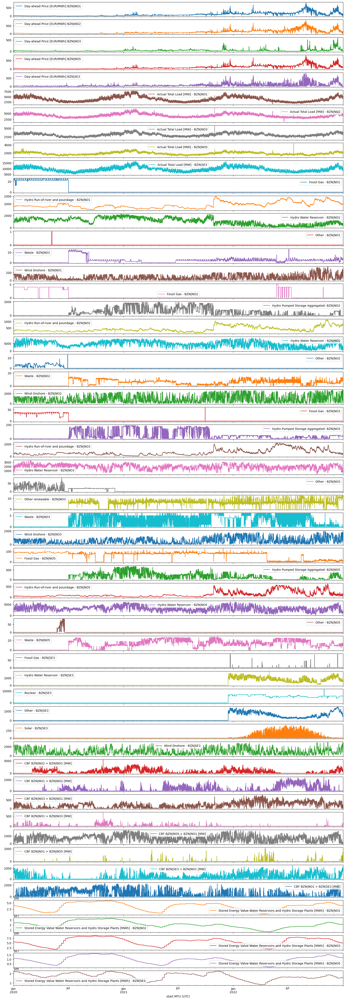

In [7]:
df.plot(x='start MTU (UTC)', subplots=True, figsize=(20, 60))

array([<Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>], dtype=object)

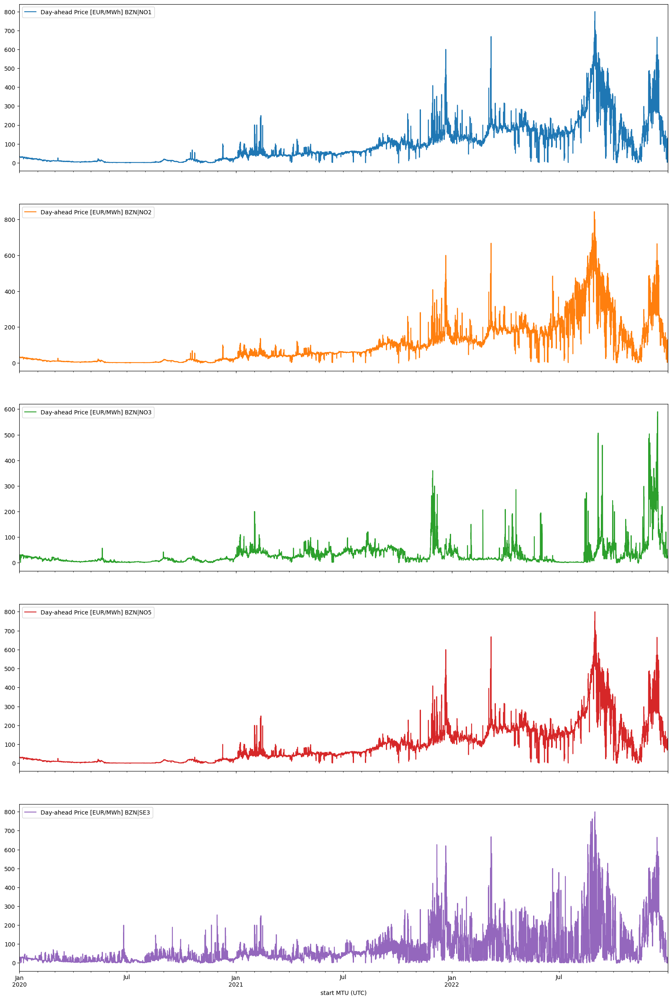

In [65]:
price = [col_name for col_name in df.columns if 'Day-ahead Price' in col_name]
price.append('start MTU (UTC)')

price_df = df.loc[:, price]

price_df.plot(x='start MTU (UTC)', subplots=True, figsize=(20, 30))

In [9]:
corr = price_df.corr()
corr.style.background_gradient(cmap='coolwarm', axis=None)

C:\Users\OKEN\AppData\Local\Temp\ipykernel_8988\4114888019.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = price_df.corr()


,Day-ahead Price [EUR/MWh] BZN|NO1,Day-ahead Price [EUR/MWh] BZN|NO2,Day-ahead Price [EUR/MWh] BZN|NO3,Day-ahead Price [EUR/MWh] BZN|NO5,Day-ahead Price [EUR/MWh] BZN|SE3
Day-ahead Price [EUR/MWh] BZN|NO1,1.000000,0.972172,0.463774,0.998956,0.771236
Day-ahead Price [EUR/MWh] BZN|NO2,0.972172,1.000000,0.390942,0.970923,0.743452
Day-ahead Price [EUR/MWh] BZN|NO3,0.463774,0.390942,1.000000,0.464462,0.560566
Day-ahead Price [EUR/MWh] BZN|NO5,0.998956,0.970923,0.464462,1.000000,0.768764
Day-ahead Price [EUR/MWh] BZN|SE3,0.771236,0.743452,0.560566,0.768764,1.000000


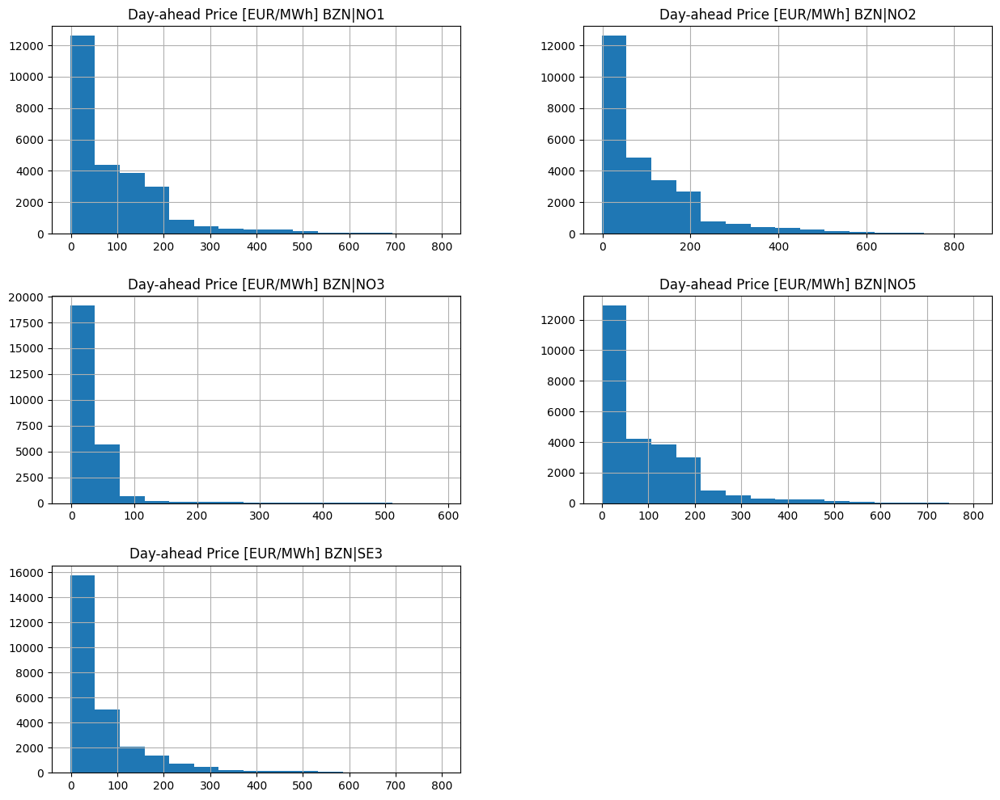

In [10]:
price_df.drop(['start MTU (UTC)'], axis=1).hist(figsize=(15,12),bins = 15)
plt.show()

<Axes: >

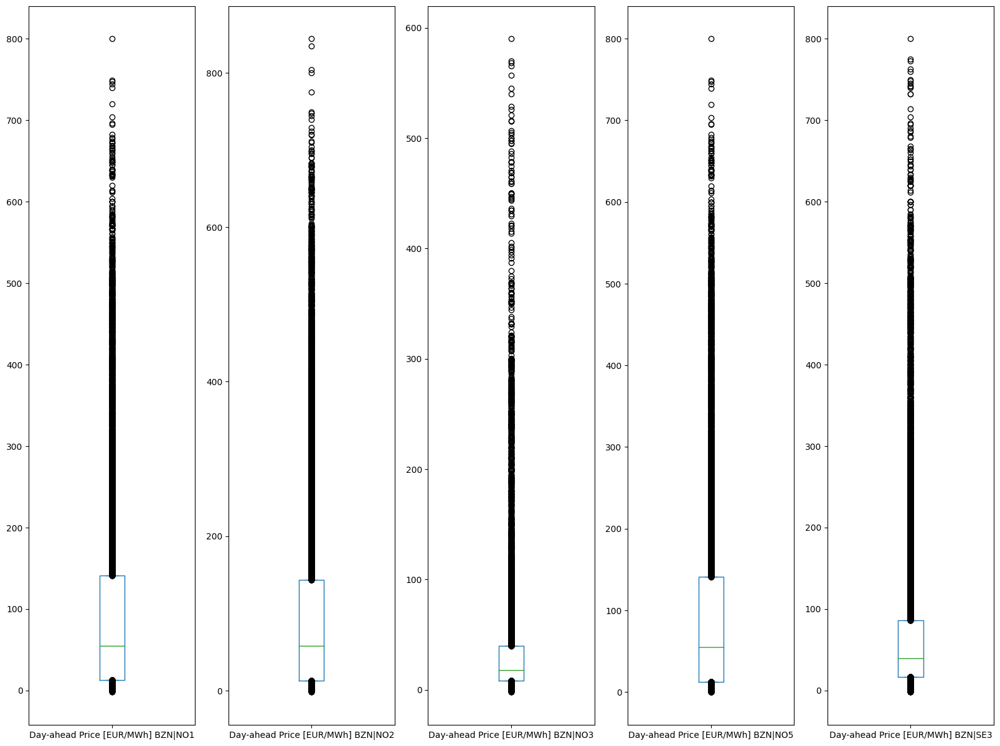

In [11]:
figure, axes = plt.subplots(1,5, figsize=(20, 15))
price_df['Day-ahead Price [EUR/MWh] BZN|NO1'].plot(kind='box', whis=(0-100), ax=axes[0])
price_df['Day-ahead Price [EUR/MWh] BZN|NO2'].plot(kind='box', whis=(0-100), ax=axes[1])
price_df['Day-ahead Price [EUR/MWh] BZN|NO3'].plot(kind='box', whis=(0-100), ax=axes[2])
price_df['Day-ahead Price [EUR/MWh] BZN|NO5'].plot(kind='box', whis=(0-100), ax=axes[3])
price_df['Day-ahead Price [EUR/MWh] BZN|SE3'].plot(kind='box', whis=(0-100), ax=axes[4])

array([<Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>], dtype=object)

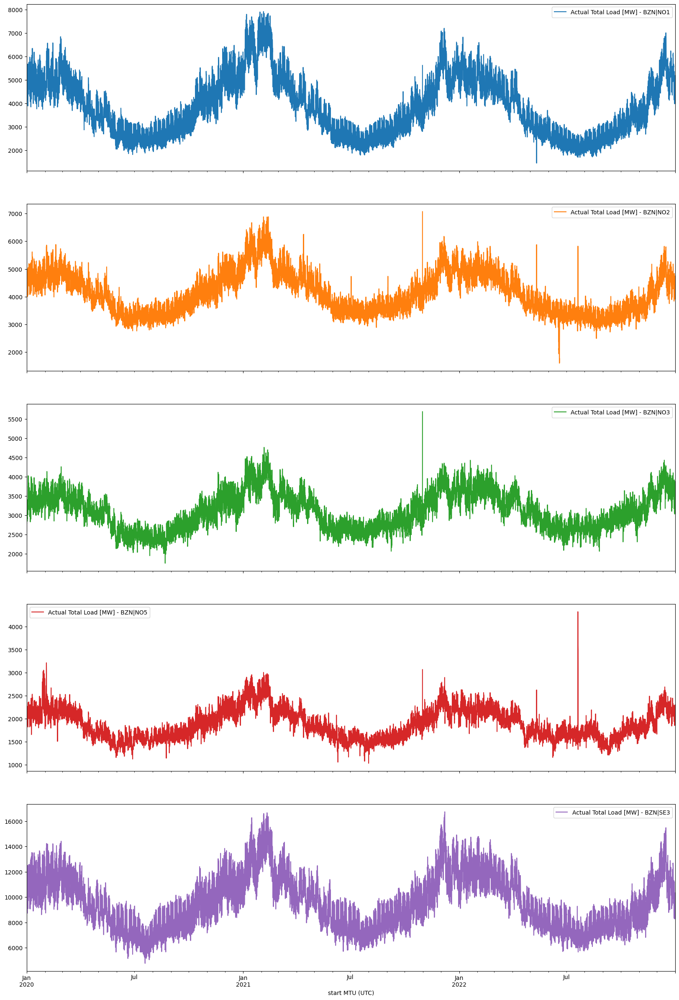

In [12]:
load = [col_name for col_name in df.columns if 'Actual Total Load' in col_name]
load.append('start MTU (UTC)')

load_df = df.loc[:, load]

load_df.plot(x='start MTU (UTC)', subplots=True, figsize=(20, 30))

In [13]:
corr = load_df.corr()
corr.style.background_gradient(cmap='coolwarm', axis=None)

C:\Users\OKEN\AppData\Local\Temp\ipykernel_8988\1246392108.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = load_df.corr()


,Actual Total Load [MW] - BZN|NO1,Actual Total Load [MW] - BZN|NO2,Actual Total Load [MW] - BZN|NO3,Actual Total Load [MW] - BZN|NO5,Actual Total Load [MW] - BZN|SE3
Actual Total Load [MW] - BZN|NO1,1.000000,0.962048,0.919751,0.929423,0.954985
Actual Total Load [MW] - BZN|NO2,0.962048,1.000000,0.905696,0.927698,0.945594
Actual Total Load [MW] - BZN|NO3,0.919751,0.905696,1.000000,0.894607,0.914181
Actual Total Load [MW] - BZN|NO5,0.929423,0.927698,0.894607,1.000000,0.908984
Actual Total Load [MW] - BZN|SE3,0.954985,0.945594,0.914181,0.908984,1.000000


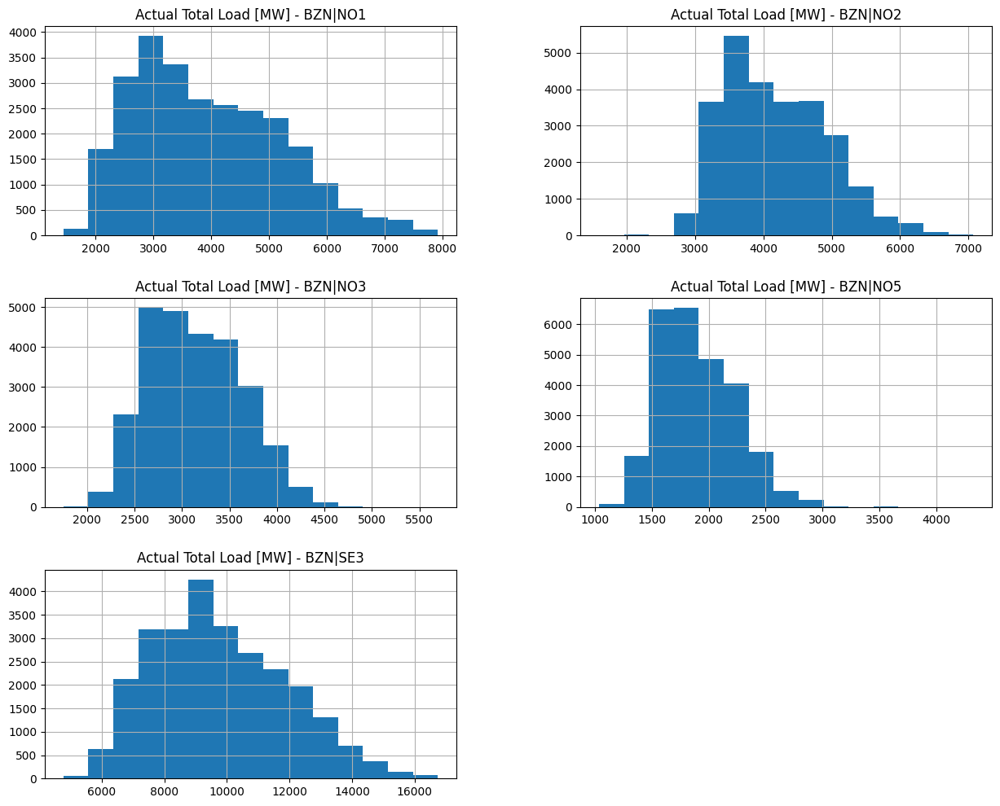

In [14]:
load_df.drop(['start MTU (UTC)'], axis=1).hist(figsize=(15,12),bins = 15)
plt.show()

<Axes: >

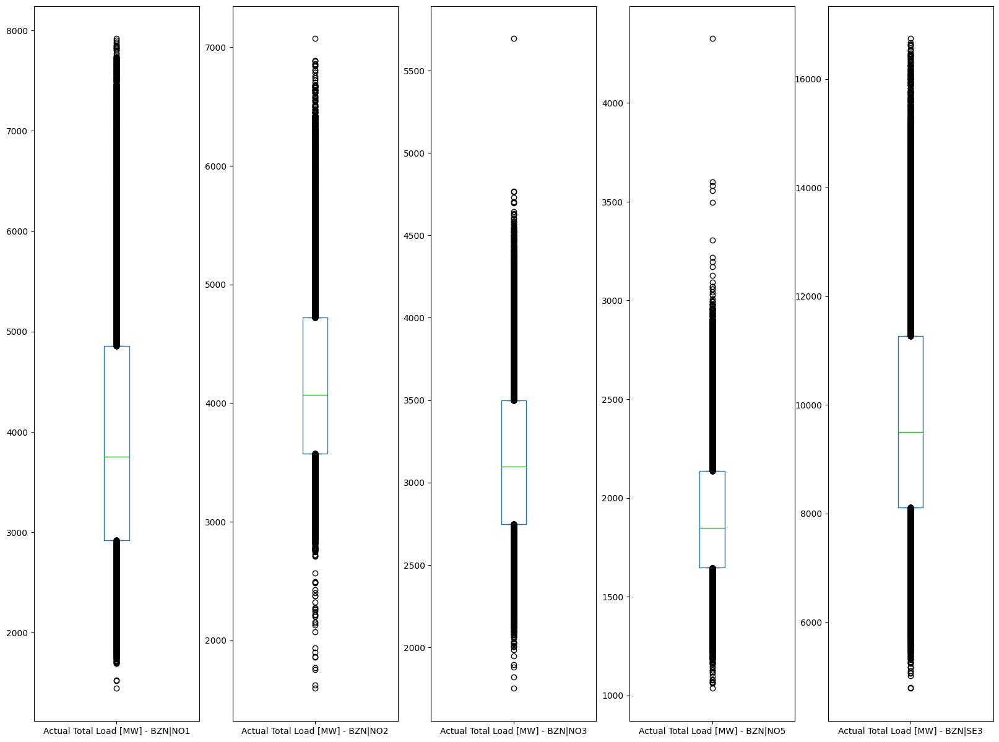

In [15]:
figure, axes = plt.subplots(1,5, figsize=(20, 15))
load_df['Actual Total Load [MW] - BZN|NO1'].plot(kind='box', whis=(0-100), ax=axes[0])
load_df['Actual Total Load [MW] - BZN|NO2'].plot(kind='box', whis=(0-100), ax=axes[1])
load_df['Actual Total Load [MW] - BZN|NO3'].plot(kind='box', whis=(0-100), ax=axes[2])
load_df['Actual Total Load [MW] - BZN|NO5'].plot(kind='box', whis=(0-100), ax=axes[3])
load_df['Actual Total Load [MW] - BZN|SE3'].plot(kind='box', whis=(0-100), ax=axes[4])

array([<Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>], dtype=object)

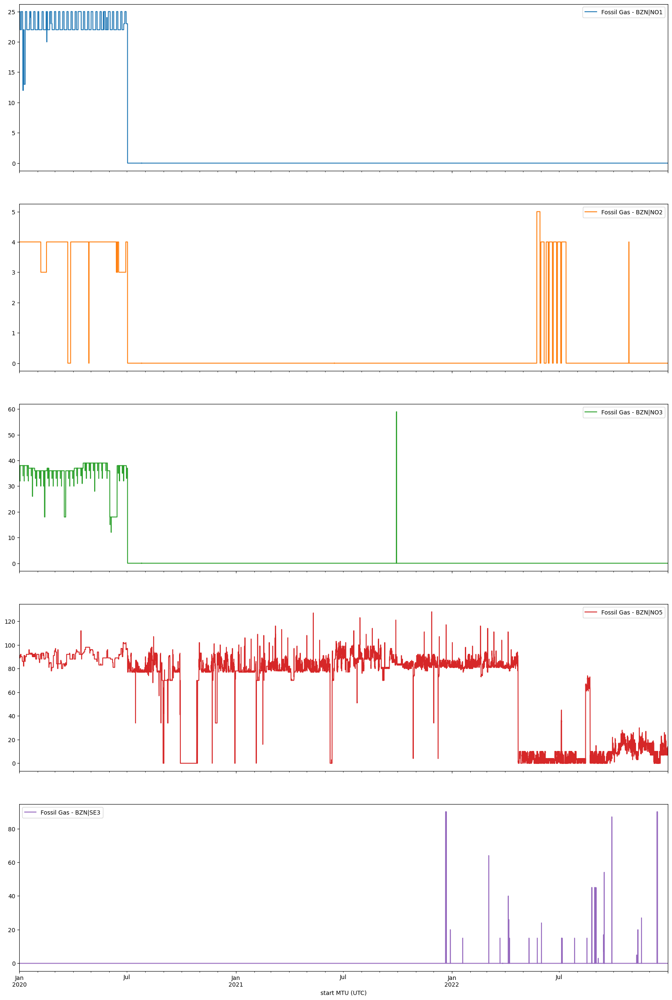

In [16]:
gas = [col_name for col_name in df.columns if 'Fossil Gas' in col_name]
gas.append('start MTU (UTC)')

gas_df = df.loc[:, gas]

gas_df.plot(x='start MTU (UTC)', subplots=True, figsize=(20, 30))

In [17]:
corr = gas_df.corr()
corr.style.background_gradient(cmap='coolwarm', axis=None)

C:\Users\OKEN\AppData\Local\Temp\ipykernel_8988\2604026604.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = gas_df.corr()


,Fossil Gas - BZN|NO1,Fossil Gas - BZN|NO2,Fossil Gas - BZN|NO3,Fossil Gas - BZN|NO5,Fossil Gas - BZN|SE3
Fossil Gas - BZN|NO1,1.000000,0.847316,0.980986,0.337788,-0.023044
Fossil Gas - BZN|NO2,0.847316,1.000000,0.836634,0.134833,-0.023754
Fossil Gas - BZN|NO3,0.980986,0.836634,1.000000,0.336897,-0.022824
Fossil Gas - BZN|NO5,0.337788,0.134833,0.336897,1.000000,-0.026845
Fossil Gas - BZN|SE3,-0.023044,-0.023754,-0.022824,-0.026845,1.000000


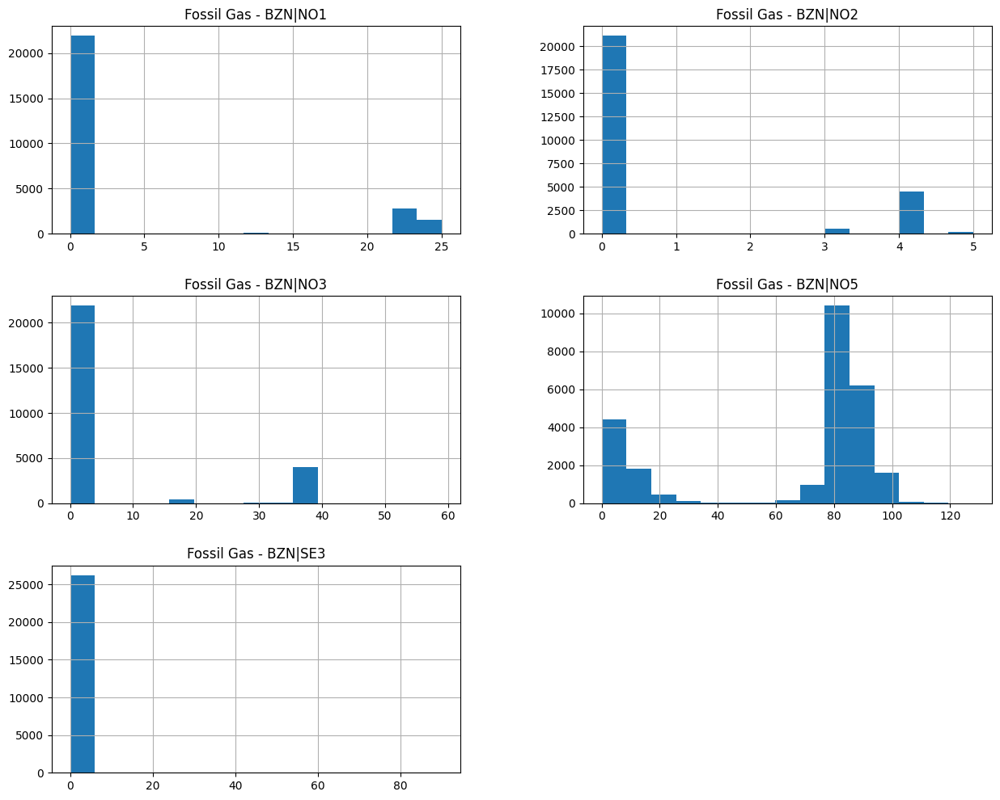

In [18]:
gas_df.drop(['start MTU (UTC)'], axis=1).hist(figsize=(15,12),bins = 15)
plt.show()

<Axes: >

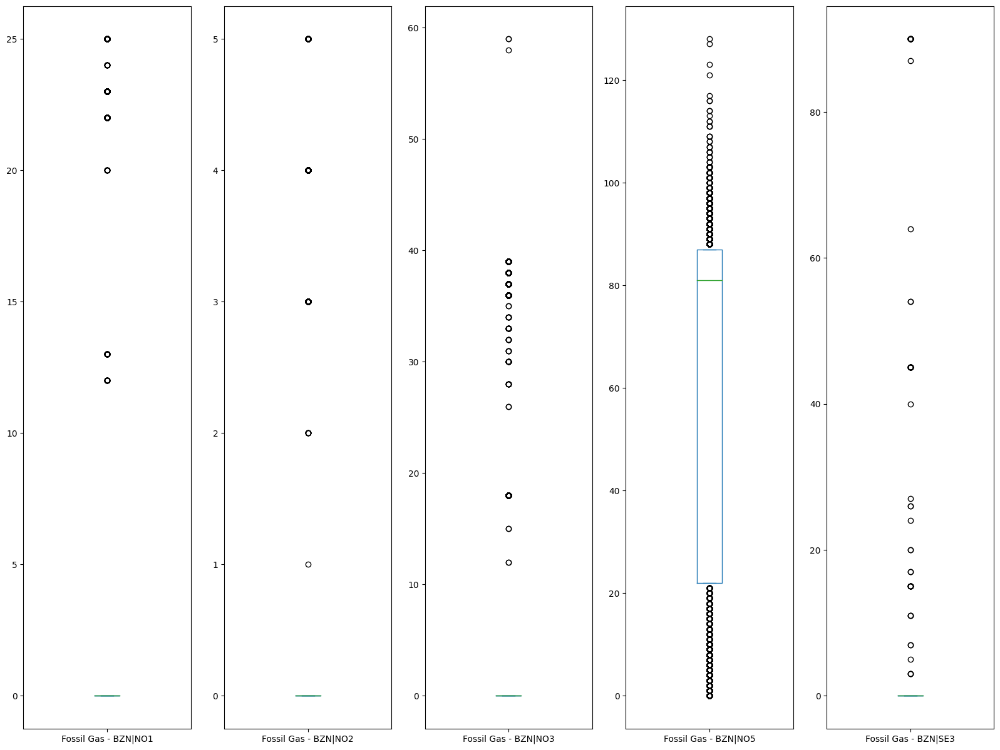

In [19]:
figure, axes = plt.subplots(1,5, figsize=(20, 15))
gas_df['Fossil Gas - BZN|NO1'].plot(kind='box', whis=(0-100), ax=axes[0])
gas_df['Fossil Gas - BZN|NO2'].plot(kind='box', whis=(0-100), ax=axes[1])
gas_df['Fossil Gas - BZN|NO3'].plot(kind='box', whis=(0-100), ax=axes[2])
gas_df['Fossil Gas - BZN|NO5'].plot(kind='box', whis=(0-100), ax=axes[3])
gas_df['Fossil Gas - BZN|SE3'].plot(kind='box', whis=(0-100), ax=axes[4])

array([<Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>],
      dtype=object)

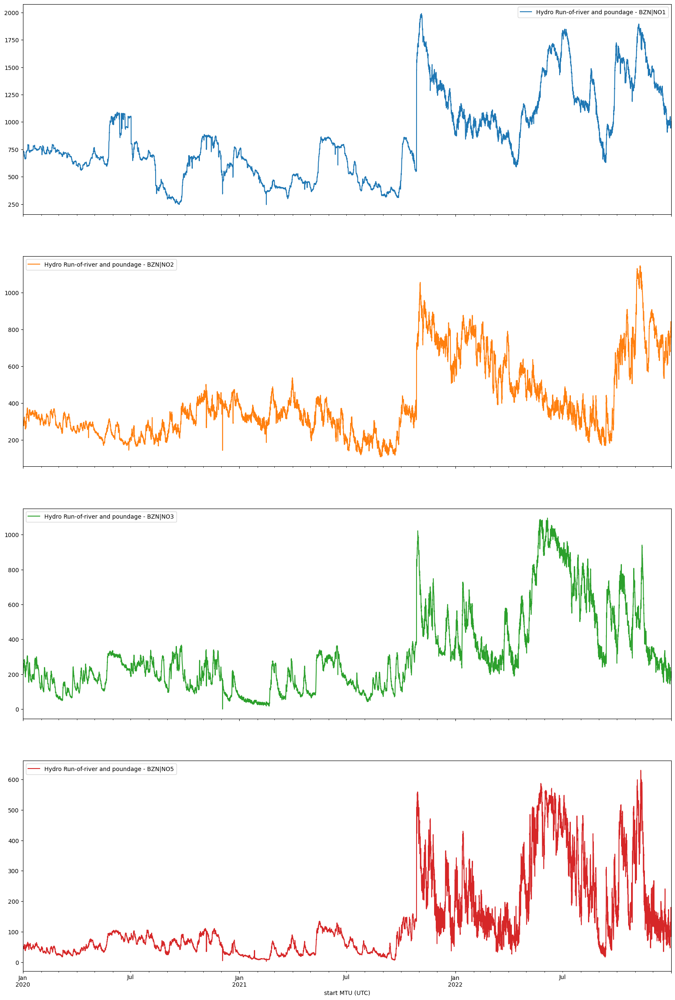

In [20]:
hydro_run_of = [col_name for col_name in df.columns if 'Hydro Run-of' in col_name]
hydro_run_of.append('start MTU (UTC)')

hydro_run_of_df = df.loc[:, hydro_run_of]

hydro_run_of_df.plot(x='start MTU (UTC)', subplots=True, figsize=(20, 30))

In [21]:
corr = hydro_run_of_df.corr()
corr.style.background_gradient(cmap='coolwarm', axis=None)

C:\Users\OKEN\AppData\Local\Temp\ipykernel_8988\1230842190.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = hydro_run_of_df.corr()


,Hydro Run-of-river and poundage - BZN|NO1,Hydro Run-of-river and poundage - BZN|NO2,Hydro Run-of-river and poundage - BZN|NO3,Hydro Run-of-river and poundage - BZN|NO5
Hydro Run-of-river and poundage - BZN|NO1,1.000000,0.654911,0.771653,0.804251
Hydro Run-of-river and poundage - BZN|NO2,0.654911,1.000000,0.401988,0.521453
Hydro Run-of-river and poundage - BZN|NO3,0.771653,0.401988,1.000000,0.925864
Hydro Run-of-river and poundage - BZN|NO5,0.804251,0.521453,0.925864,1.000000


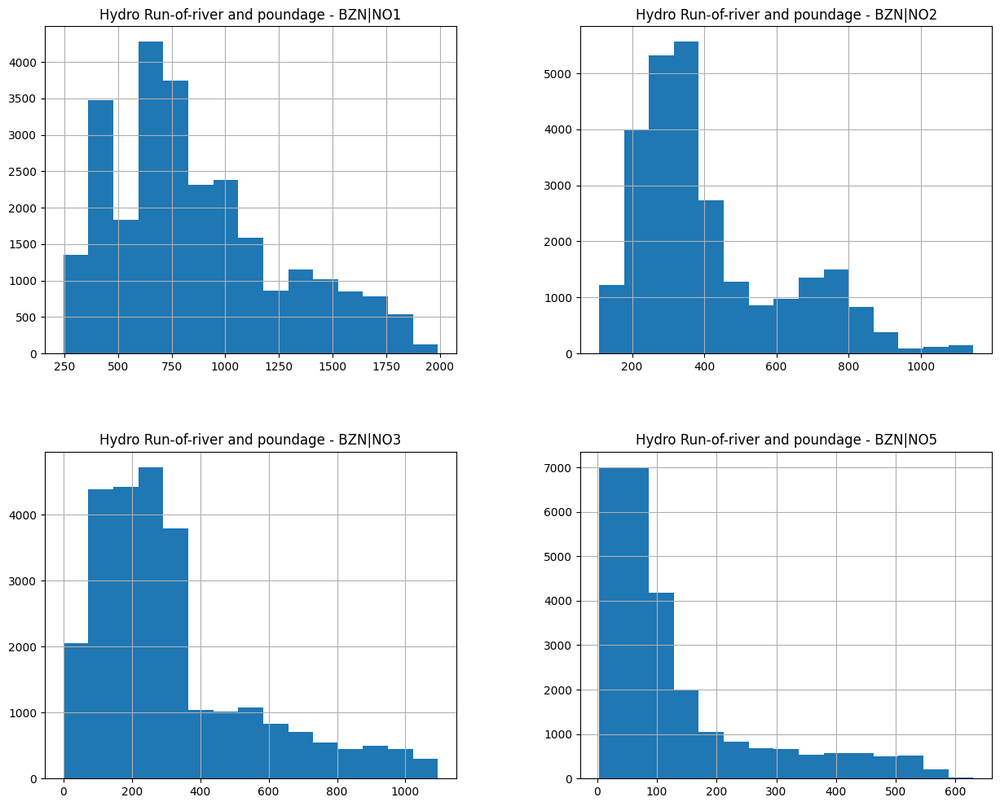

In [22]:
hydro_run_of_df.drop(['start MTU (UTC)'], axis=1).hist(figsize=(15,12),bins = 15)
plt.show()

<Axes: >

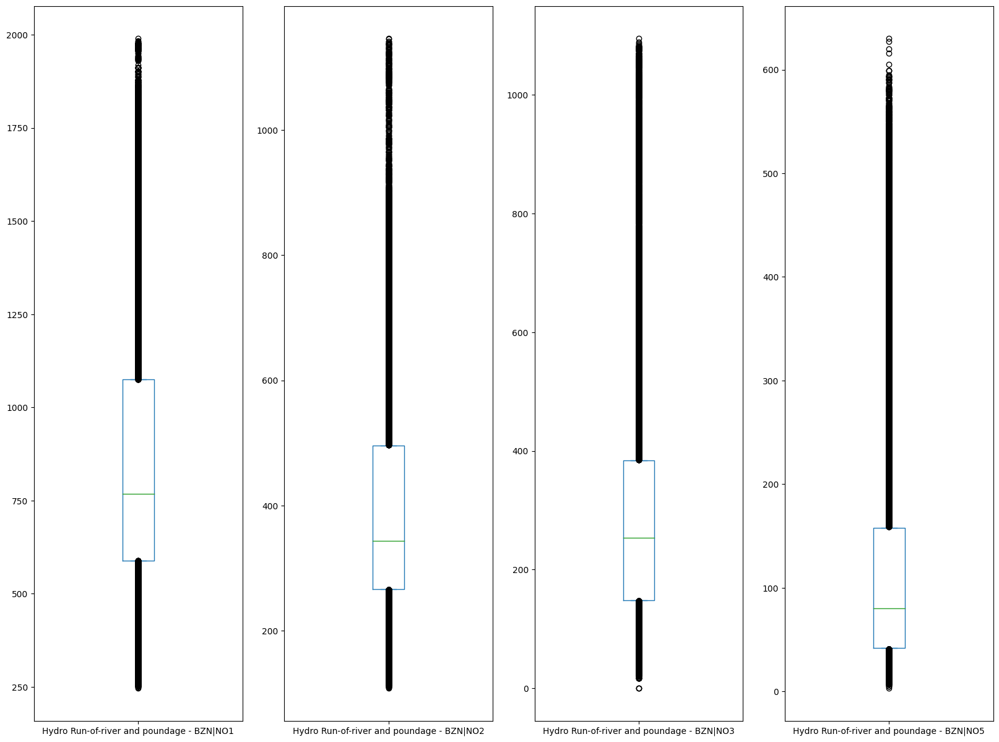

In [23]:
figure, axes = plt.subplots(1,4, figsize=(20, 15))
hydro_run_of_df['Hydro Run-of-river and poundage - BZN|NO1'].plot(kind='box', whis=(0-100), ax=axes[0])
hydro_run_of_df['Hydro Run-of-river and poundage - BZN|NO2'].plot(kind='box', whis=(0-100), ax=axes[1])
hydro_run_of_df['Hydro Run-of-river and poundage - BZN|NO3'].plot(kind='box', whis=(0-100), ax=axes[2])
hydro_run_of_df['Hydro Run-of-river and poundage - BZN|NO5'].plot(kind='box', whis=(0-100), ax=axes[3])

array([<Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>], dtype=object)

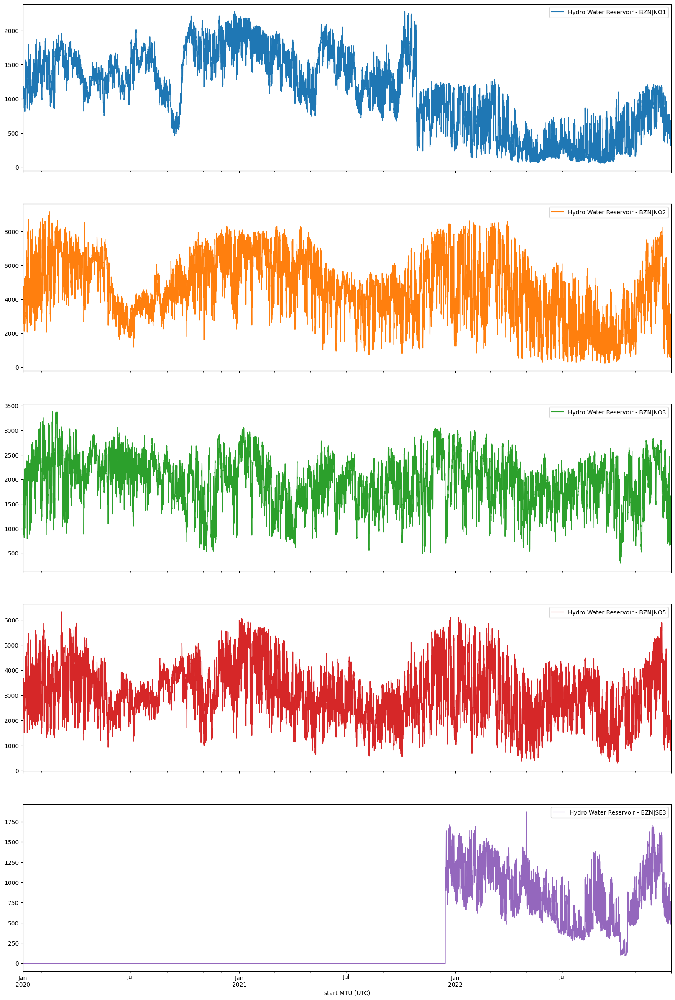

In [24]:
hydro_water_reservoir = [col_name for col_name in df.columns if 'Hydro Water Reservoir' in col_name]
hydro_water_reservoir.append('start MTU (UTC)')

hydro_water_reservoir_df = df.loc[:, hydro_water_reservoir]

hydro_water_reservoir_df.plot(x='start MTU (UTC)', subplots=True, figsize=(20, 30))

In [25]:
corr = hydro_water_reservoir_df.corr()
corr.style.background_gradient(cmap='coolwarm', axis=None)

C:\Users\OKEN\AppData\Local\Temp\ipykernel_8988\2121215866.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = hydro_water_reservoir_df.corr()


,Hydro Water Reservoir - BZN|NO1,Hydro Water Reservoir - BZN|NO2,Hydro Water Reservoir - BZN|NO3,Hydro Water Reservoir - BZN|NO5,Hydro Water Reservoir - BZN|SE3
Hydro Water Reservoir - BZN|NO1,1.000000,0.575421,0.257493,0.476107,-0.580278
Hydro Water Reservoir - BZN|NO2,0.575421,1.000000,0.400482,0.763230,-0.068881
Hydro Water Reservoir - BZN|NO3,0.257493,0.400482,1.000000,0.478090,0.025106
Hydro Water Reservoir - BZN|NO5,0.476107,0.763230,0.478090,1.000000,0.018833
Hydro Water Reservoir - BZN|SE3,-0.580278,-0.068881,0.025106,0.018833,1.000000


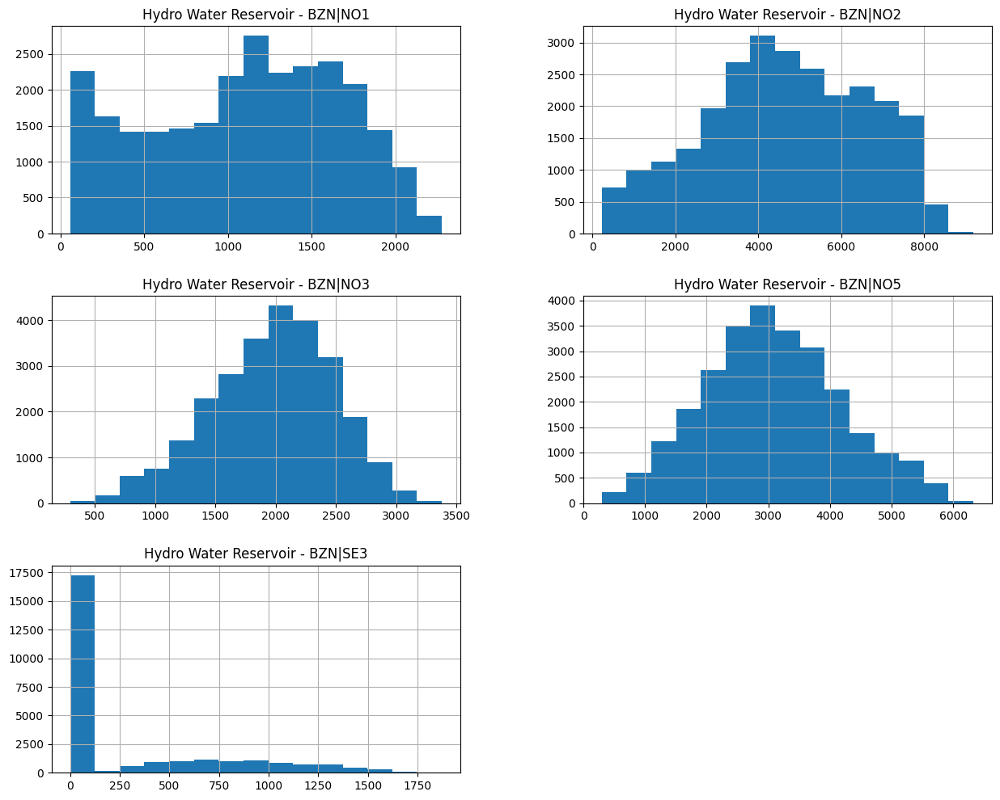

In [26]:
hydro_water_reservoir_df.drop(['start MTU (UTC)'], axis=1).hist(figsize=(15,12),bins = 15)
plt.show()

<Axes: >

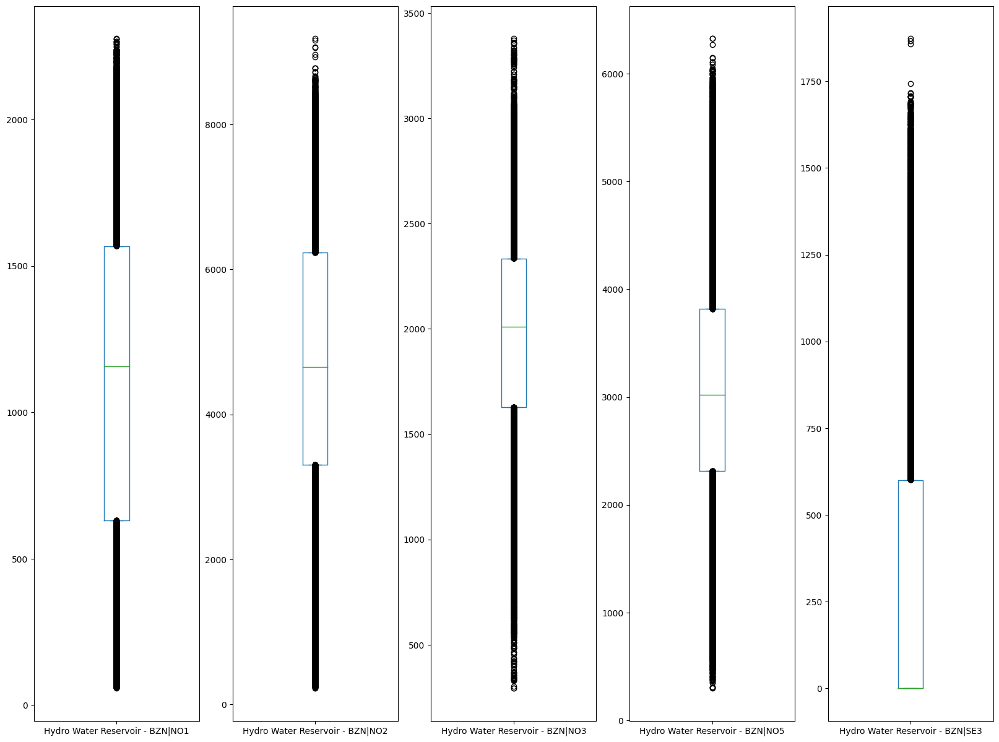

In [27]:
figure, axes = plt.subplots(1,5, figsize=(20, 15))
hydro_water_reservoir_df['Hydro Water Reservoir - BZN|NO1'].plot(kind='box', whis=(0-100), ax=axes[0])
hydro_water_reservoir_df['Hydro Water Reservoir - BZN|NO2'].plot(kind='box', whis=(0-100), ax=axes[1])
hydro_water_reservoir_df['Hydro Water Reservoir - BZN|NO3'].plot(kind='box', whis=(0-100), ax=axes[2])
hydro_water_reservoir_df['Hydro Water Reservoir - BZN|NO5'].plot(kind='box', whis=(0-100), ax=axes[3])
hydro_water_reservoir_df['Hydro Water Reservoir - BZN|SE3'].plot(kind='box', whis=(0-100), ax=axes[4])

array([<Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>], dtype=object)

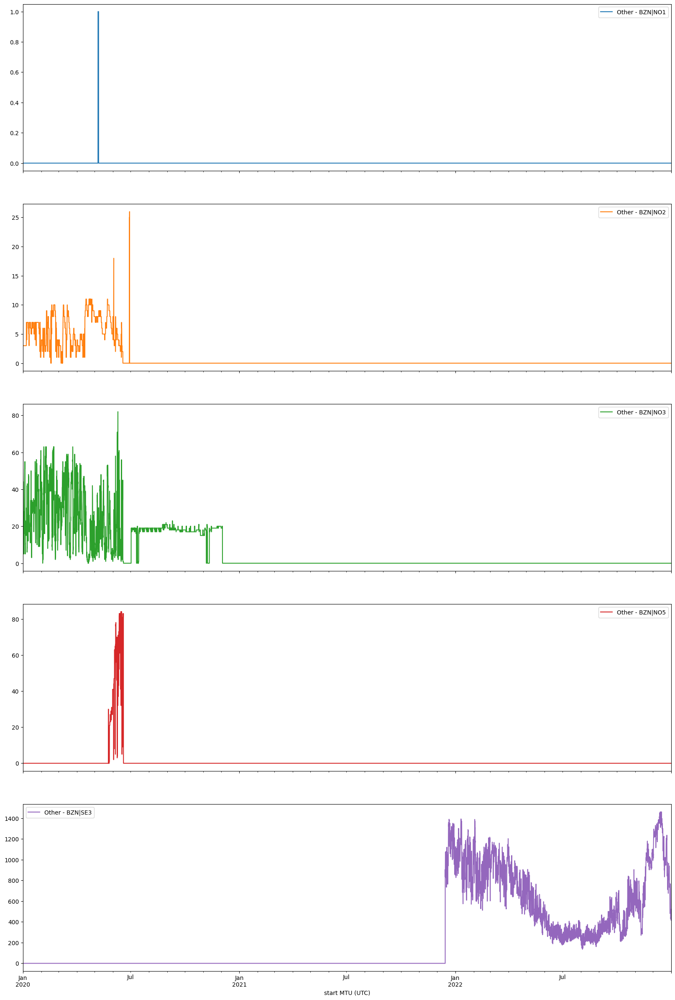

In [28]:
other = [col_name for col_name in df.columns if 'Other -' in col_name]
other.append('start MTU (UTC)')

other_df = df.loc[:, other]

other_df.plot(x='start MTU (UTC)', subplots=True, figsize=(20, 30))

In [29]:
corr = other_df.corr()
corr.style.background_gradient(cmap='coolwarm', axis=None)

C:\Users\OKEN\AppData\Local\Temp\ipykernel_8988\4211476995.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = other_df.corr()


,Other - BZN|NO1,Other - BZN|NO2,Other - BZN|NO3,Other - BZN|NO5,Other - BZN|SE3
Other - BZN|NO1,1.000000,0.091239,0.027669,-0.004159,-0.018688
Other - BZN|NO2,0.091239,1.000000,0.540269,0.185674,-0.231804
Other - BZN|NO3,0.027669,0.540269,1.000000,0.100867,-0.327714
Other - BZN|NO5,-0.004159,0.185674,0.100867,1.000000,-0.085105
Other - BZN|SE3,-0.018688,-0.231804,-0.327714,-0.085105,1.000000


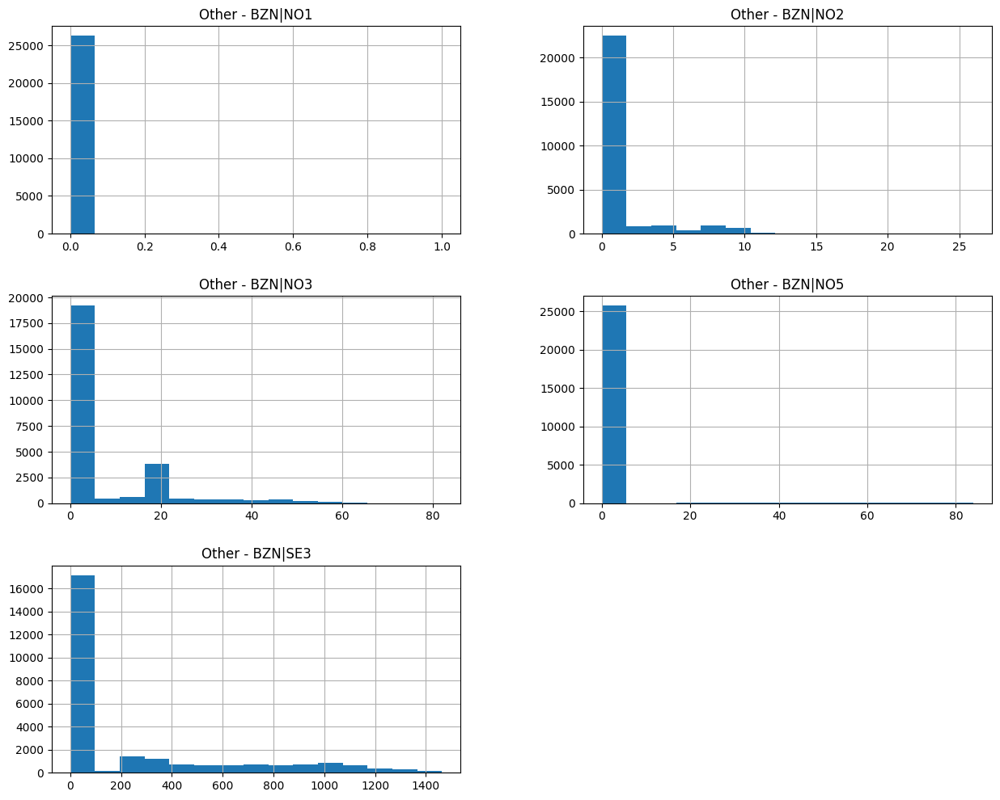

In [30]:
other_df.drop(['start MTU (UTC)'], axis=1).hist(figsize=(15,12),bins = 15)
plt.show()

<Axes: >

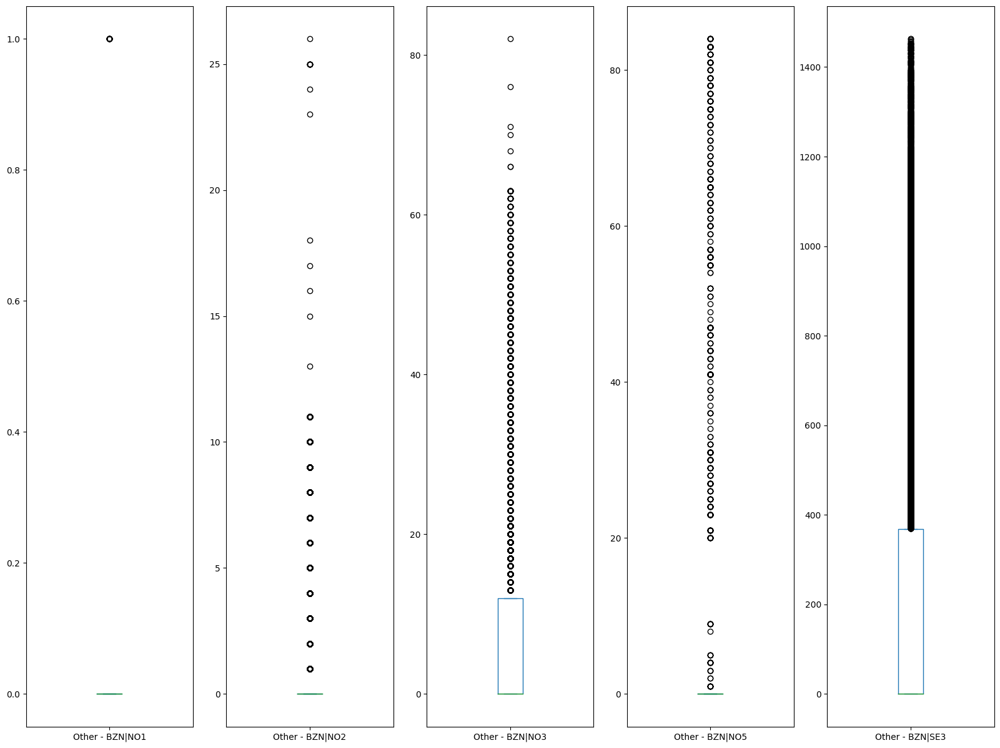

In [31]:
figure, axes = plt.subplots(1,5, figsize=(20, 15))
other_df['Other - BZN|NO1'].plot(kind='box', whis=(0-100), ax=axes[0])
other_df['Other - BZN|NO2'].plot(kind='box', whis=(0-100), ax=axes[1])
other_df['Other - BZN|NO3'].plot(kind='box', whis=(0-100), ax=axes[2])
other_df['Other - BZN|NO5'].plot(kind='box', whis=(0-100), ax=axes[3])
other_df['Other - BZN|SE3'].plot(kind='box', whis=(0-100), ax=axes[4])

array([<Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>],
      dtype=object)

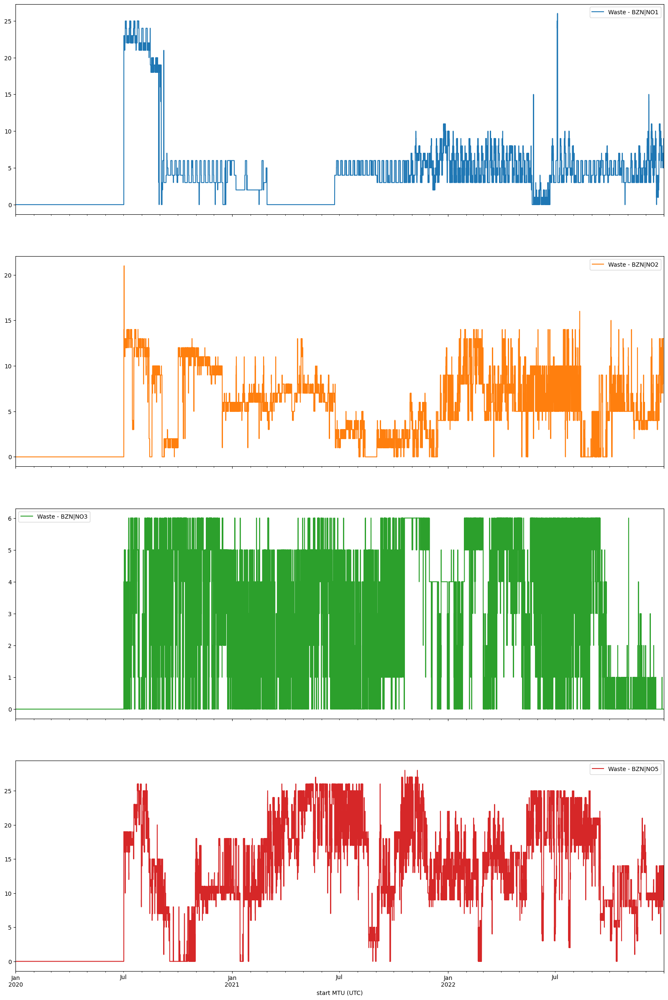

In [32]:
waste = [col_name for col_name in df.columns if 'Waste -' in col_name]
waste.append('start MTU (UTC)')

waste_df = df.loc[:, waste]

waste_df.plot(x='start MTU (UTC)', subplots=True, figsize=(20, 30))

In [34]:
corr = waste_df.corr()
corr.style.background_gradient(cmap='coolwarm', axis=None)

C:\Users\OKEN\AppData\Local\Temp\ipykernel_8988\2553352146.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = waste_df.corr()


,Waste - BZN|NO1,Waste - BZN|NO2,Waste - BZN|NO3,Waste - BZN|NO5
Waste - BZN|NO1,1.000000,0.413718,0.192627,0.272398
Waste - BZN|NO2,0.413718,1.000000,0.338491,0.392374
Waste - BZN|NO3,0.192627,0.338491,1.000000,0.355338
Waste - BZN|NO5,0.272398,0.392374,0.355338,1.000000


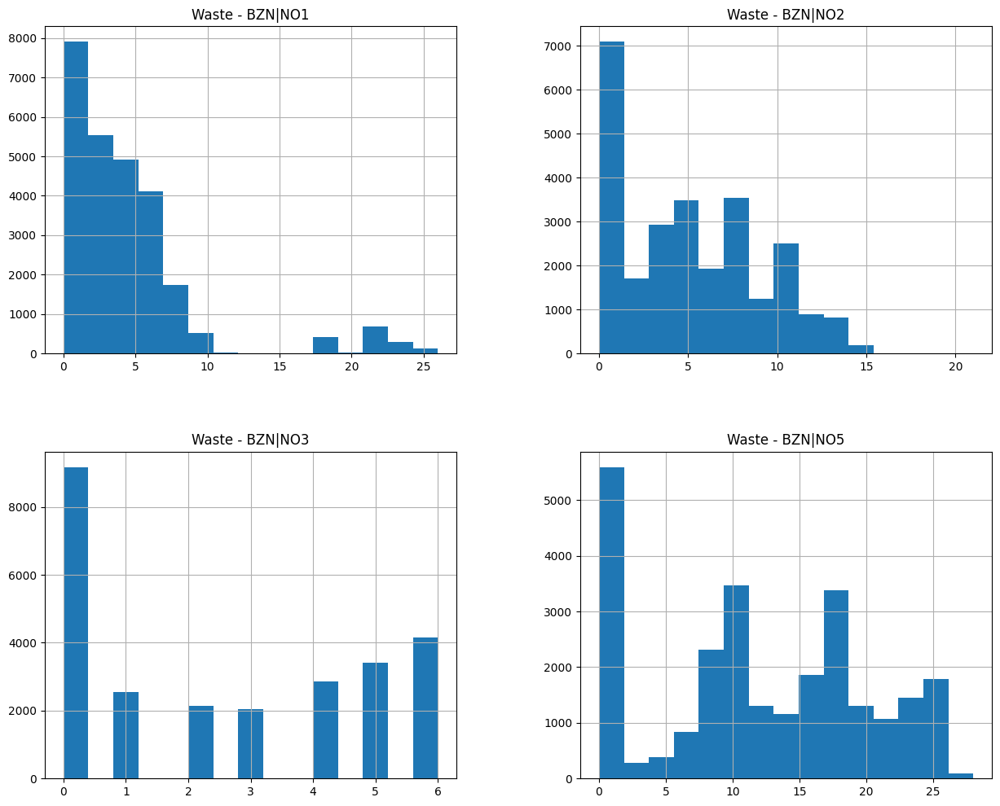

In [35]:
waste_df.drop(['start MTU (UTC)'], axis=1).hist(figsize=(15,12),bins = 15)
plt.show()

<Axes: >

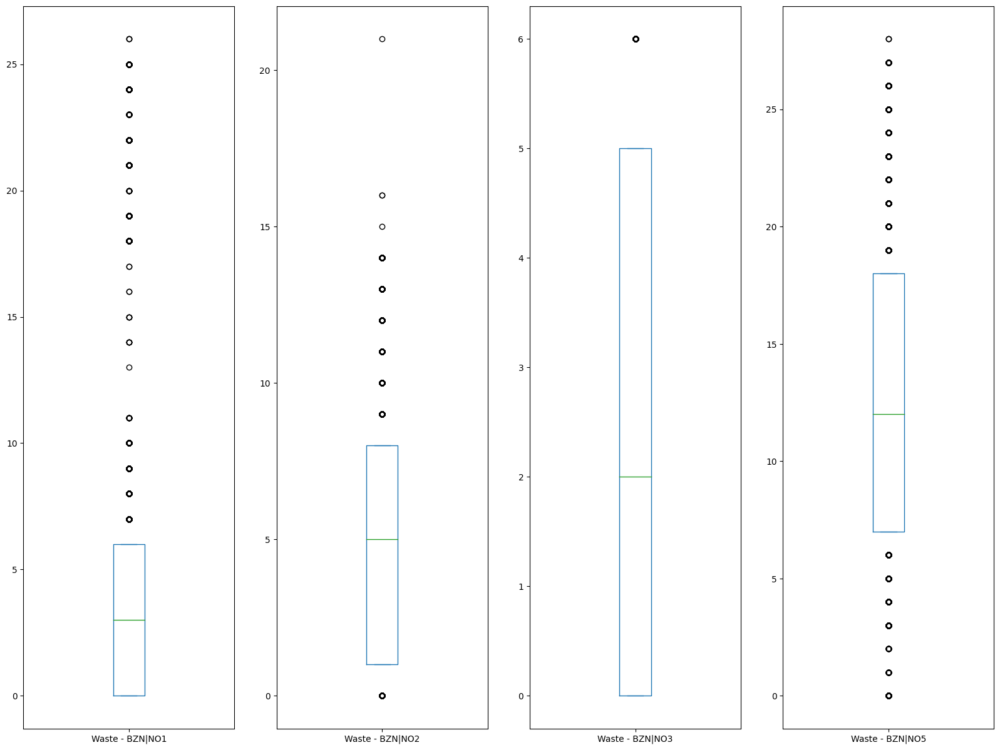

In [36]:
figure, axes = plt.subplots(1,4, figsize=(20, 15))
waste_df['Waste - BZN|NO1'].plot(kind='box', whis=(0-100), ax=axes[0])
waste_df['Waste - BZN|NO2'].plot(kind='box', whis=(0-100), ax=axes[1])
waste_df['Waste - BZN|NO3'].plot(kind='box', whis=(0-100), ax=axes[2])
waste_df['Waste - BZN|NO5'].plot(kind='box', whis=(0-100), ax=axes[3])

array([<Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>],
      dtype=object)

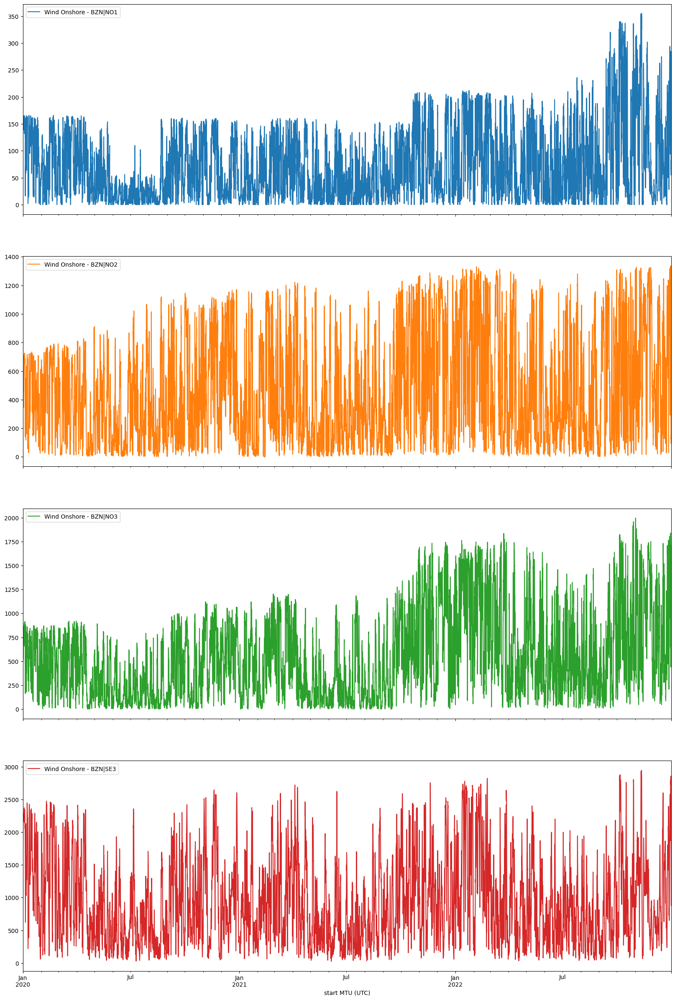

In [37]:
wind_onshore = [col_name for col_name in df.columns if 'Wind Onshore' in col_name]
wind_onshore.append('start MTU (UTC)')

wind_onshore_df = df.loc[:, wind_onshore]

wind_onshore_df.plot(x='start MTU (UTC)', subplots=True, figsize=(20, 30))

In [38]:
corr = wind_onshore_df.corr()
corr.style.background_gradient(cmap='coolwarm', axis=None)

C:\Users\OKEN\AppData\Local\Temp\ipykernel_8988\4169406230.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = wind_onshore_df.corr()


,Wind Onshore - BZN|NO1,Wind Onshore - BZN|NO2,Wind Onshore - BZN|NO3,Wind Onshore - BZN|SE3
Wind Onshore - BZN|NO1,1.000000,0.385930,0.480812,0.685390
Wind Onshore - BZN|NO2,0.385930,1.000000,0.434883,0.406953
Wind Onshore - BZN|NO3,0.480812,0.434883,1.000000,0.437211
Wind Onshore - BZN|SE3,0.685390,0.406953,0.437211,1.000000


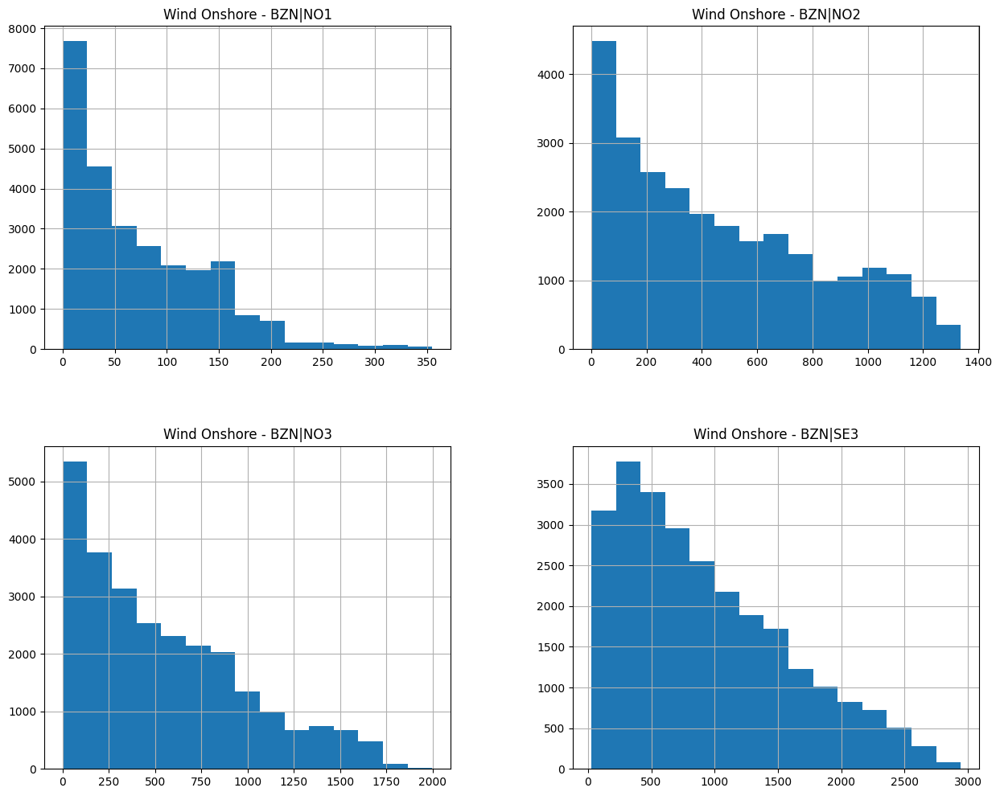

In [39]:
wind_onshore_df.drop(['start MTU (UTC)'], axis=1).hist(figsize=(15,12),bins = 15)
plt.show()

<Axes: >

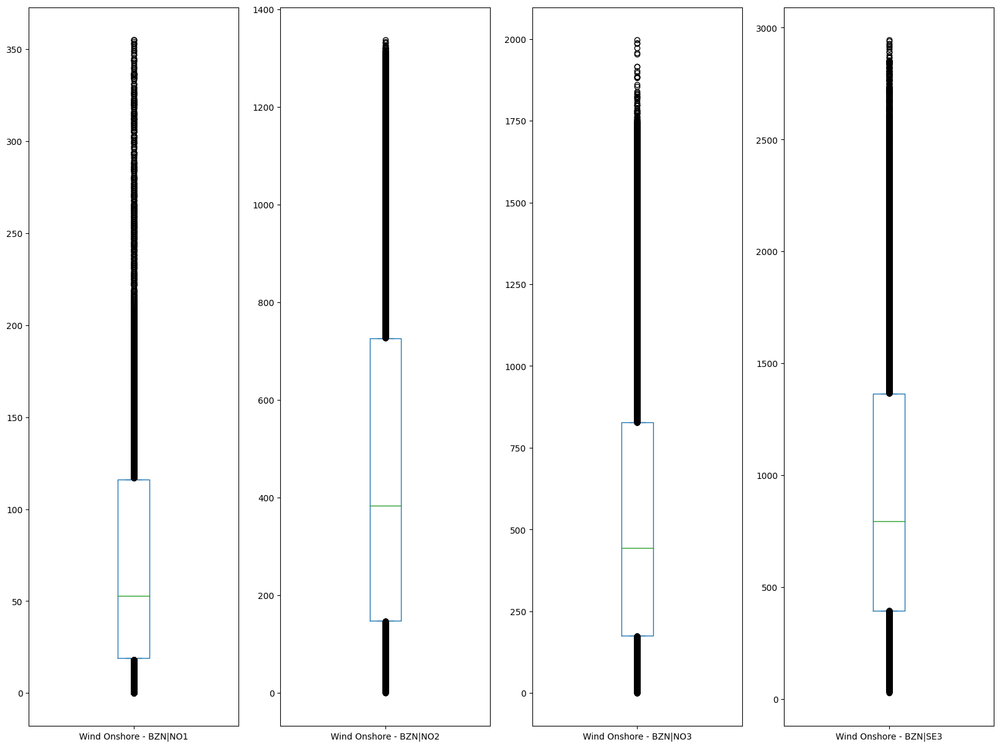

In [40]:
figure, axes = plt.subplots(1,4, figsize=(20, 15))
wind_onshore_df['Wind Onshore - BZN|NO1'].plot(kind='box', whis=(0-100), ax=axes[0])
wind_onshore_df['Wind Onshore - BZN|NO2'].plot(kind='box', whis=(0-100), ax=axes[1])
wind_onshore_df['Wind Onshore - BZN|NO3'].plot(kind='box', whis=(0-100), ax=axes[2])
wind_onshore_df['Wind Onshore - BZN|SE3'].plot(kind='box', whis=(0-100), ax=axes[3])

array([<Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>],
      dtype=object)

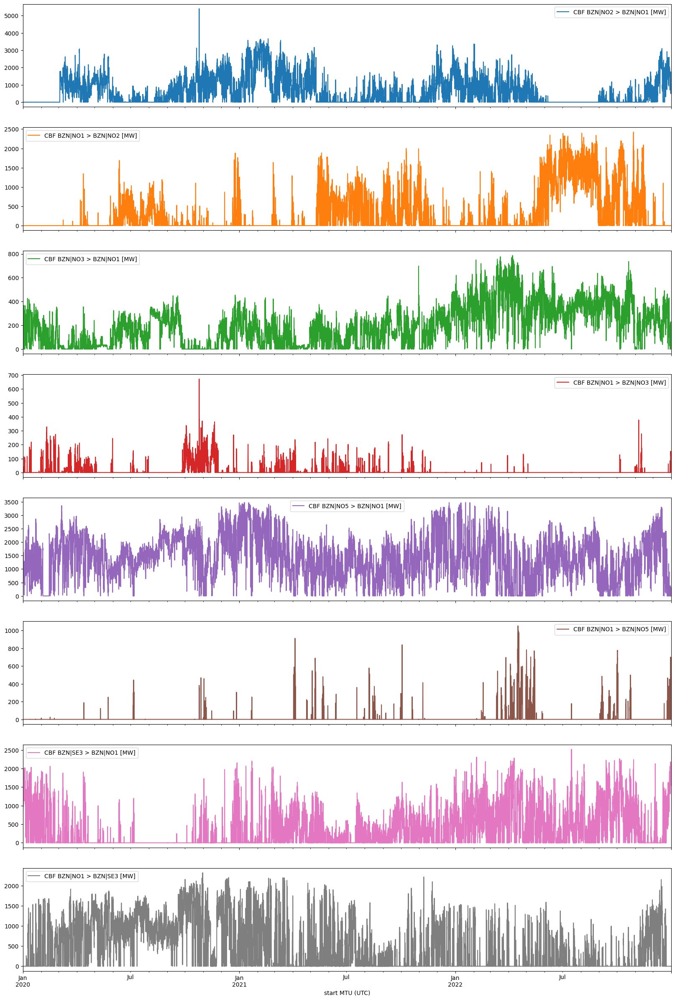

In [41]:
export = [col_name for col_name in df.columns if 'CBF' in col_name]
export.append('start MTU (UTC)')

export_df = df.loc[:, export]

export_df.plot(x='start MTU (UTC)', subplots=True, figsize=(20, 30))

In [42]:
corr = export_df.corr()
corr.style.background_gradient(cmap='coolwarm', axis=None)

C:\Users\OKEN\AppData\Local\Temp\ipykernel_8988\838638575.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = export_df.corr()


,CBF BZN|NO2 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|NO2 [MW],CBF BZN|NO3 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|NO3 [MW],CBF BZN|NO5 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|NO5 [MW],CBF BZN|SE3 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|SE3 [MW]
CBF BZN|NO2 > BZN|NO1 [MW],1.000000,-0.442269,-0.226745,0.139308,0.260021,0.056715,-0.204629,0.401094
CBF BZN|NO1 > BZN|NO2 [MW],-0.442269,1.000000,0.277052,-0.132960,-0.068780,-0.071571,0.200310,-0.311376
CBF BZN|NO3 > BZN|NO1 [MW],-0.226745,0.277052,1.000000,-0.369099,-0.110808,0.103997,0.359949,-0.355142
CBF BZN|NO1 > BZN|NO3 [MW],0.139308,-0.132960,-0.369099,1.000000,-0.125199,0.098972,-0.034627,0.092972
CBF BZN|NO5 > BZN|NO1 [MW],0.260021,-0.068780,-0.110808,-0.125199,1.000000,-0.289592,-0.585006,0.583761
CBF BZN|NO1 > BZN|NO5 [MW],0.056715,-0.071571,0.103997,0.098972,-0.289592,1.000000,0.298978,-0.128602
CBF BZN|SE3 > BZN|NO1 [MW],-0.204629,0.200310,0.359949,-0.034627,-0.585006,0.298978,1.000000,-0.547191
CBF BZN|NO1 > BZN|SE3 [MW],0.401094,-0.311376,-0.355142,0.092972,0.583761,-0.128602,-0.547191,1.000000


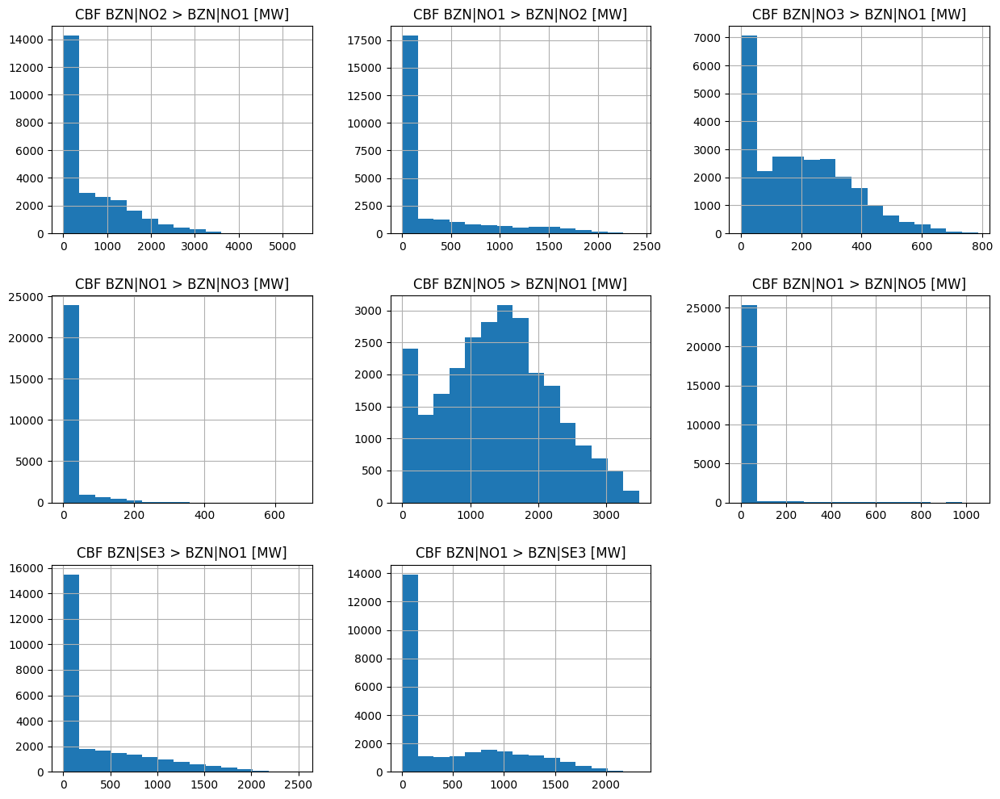

In [43]:
export_df.drop(['start MTU (UTC)'], axis=1).hist(figsize=(15,12),bins = 15)
plt.show()

<Axes: >

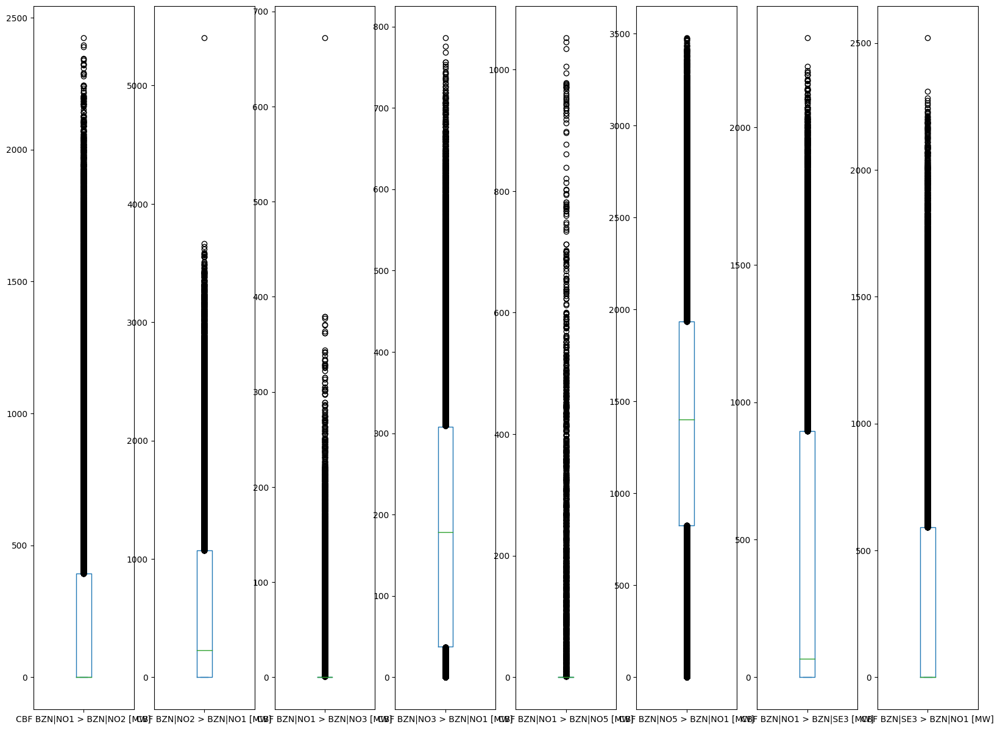

In [44]:
figure, axes = plt.subplots(1,8, figsize=(20, 15))
export_df['CBF BZN|NO1 > BZN|NO2 [MW]'].plot(kind='box', whis=(0-100), ax=axes[0])
export_df['CBF BZN|NO2 > BZN|NO1 [MW]'].plot(kind='box', whis=(0-100), ax=axes[1])
export_df['CBF BZN|NO1 > BZN|NO3 [MW]'].plot(kind='box', whis=(0-100), ax=axes[2])
export_df['CBF BZN|NO3 > BZN|NO1 [MW]'].plot(kind='box', whis=(0-100), ax=axes[3])
export_df['CBF BZN|NO1 > BZN|NO5 [MW]'].plot(kind='box', whis=(0-100), ax=axes[4])
export_df['CBF BZN|NO5 > BZN|NO1 [MW]'].plot(kind='box', whis=(0-100), ax=axes[5])
export_df['CBF BZN|NO1 > BZN|SE3 [MW]'].plot(kind='box', whis=(0-100), ax=axes[6])
export_df['CBF BZN|SE3 > BZN|NO1 [MW]'].plot(kind='box', whis=(0-100), ax=axes[7])

array([<Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>], dtype=object)

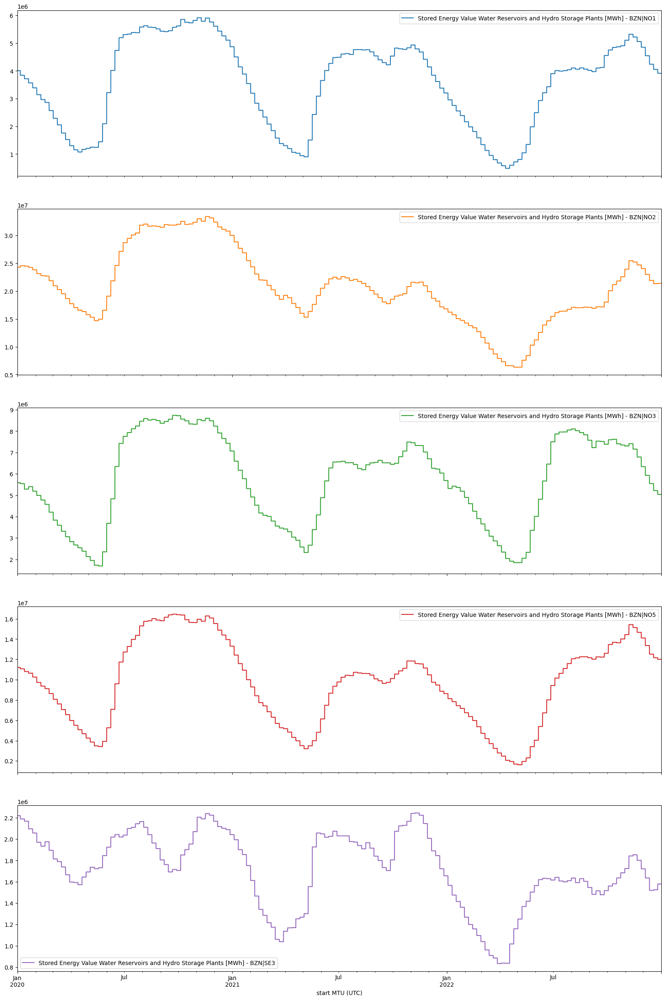

In [45]:
stored_energy = [col_name for col_name in df.columns if 'Stored Energy' in col_name]
stored_energy.append('start MTU (UTC)')

stored_energy_df = df.loc[:, stored_energy]

stored_energy_df.plot(x='start MTU (UTC)', subplots=True, figsize=(20, 30))

In [46]:
corr = stored_energy_df.corr()
corr.style.background_gradient(cmap='coolwarm', axis=None)

C:\Users\OKEN\AppData\Local\Temp\ipykernel_8988\2754967716.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = stored_energy_df.corr()


,Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|NO1,Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|NO2,Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|NO3,Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|NO5,Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|SE3
Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|NO1,1.000000,0.795798,0.944222,0.938376,0.749064
Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|NO2,0.795798,1.000000,0.703961,0.842897,0.698700
Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|NO3,0.944222,0.703961,1.000000,0.932446,0.594015
Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|NO5,0.938376,0.842897,0.932446,1.000000,0.623307
Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|SE3,0.749064,0.698700,0.594015,0.623307,1.000000


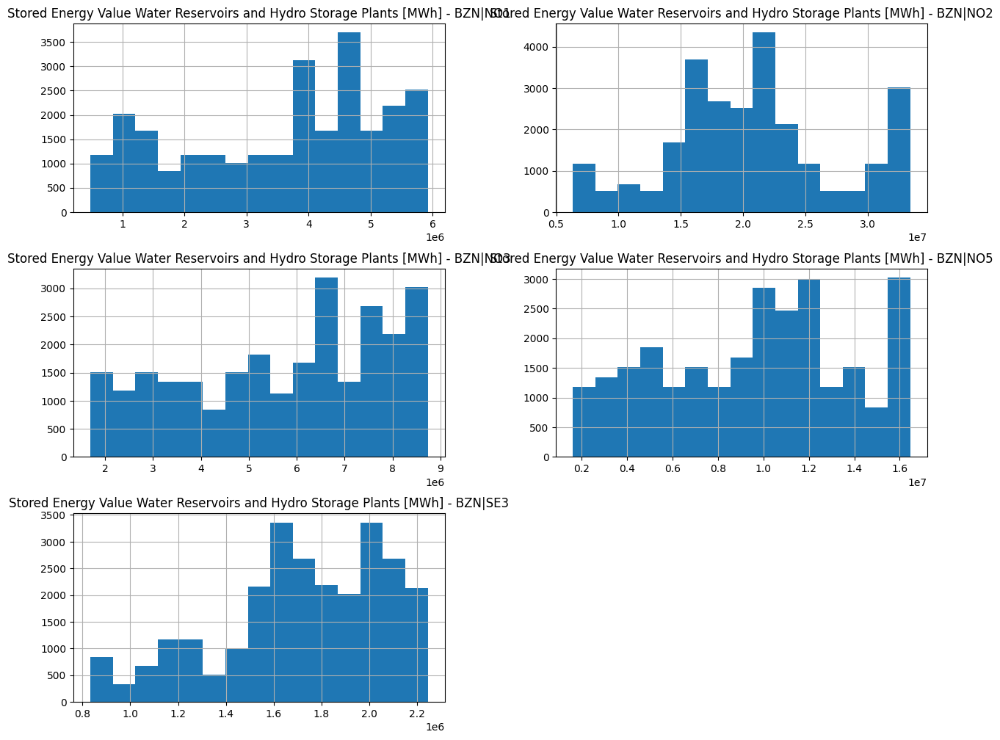

In [47]:
stored_energy_df.drop(['start MTU (UTC)'], axis=1).hist(figsize=(15,12),bins = 15)
plt.show()

<Axes: >

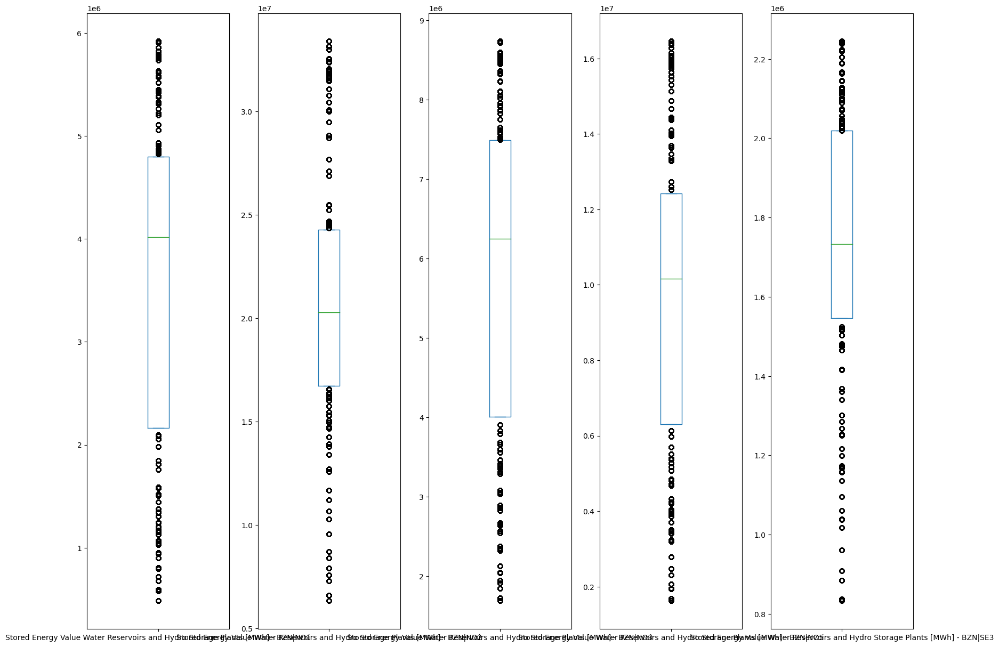

In [48]:
figure, axes = plt.subplots(1,5, figsize=(20, 15))
stored_energy_df['Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|NO1'].plot(kind='box', whis=(0-100), ax=axes[0])
stored_energy_df['Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|NO2'].plot(kind='box', whis=(0-100), ax=axes[1])
stored_energy_df['Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|NO3'].plot(kind='box', whis=(0-100), ax=axes[2])
stored_energy_df['Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|NO5'].plot(kind='box', whis=(0-100), ax=axes[3])
stored_energy_df['Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|SE3'].plot(kind='box', whis=(0-100), ax=axes[4])

array([<Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>], dtype=object)

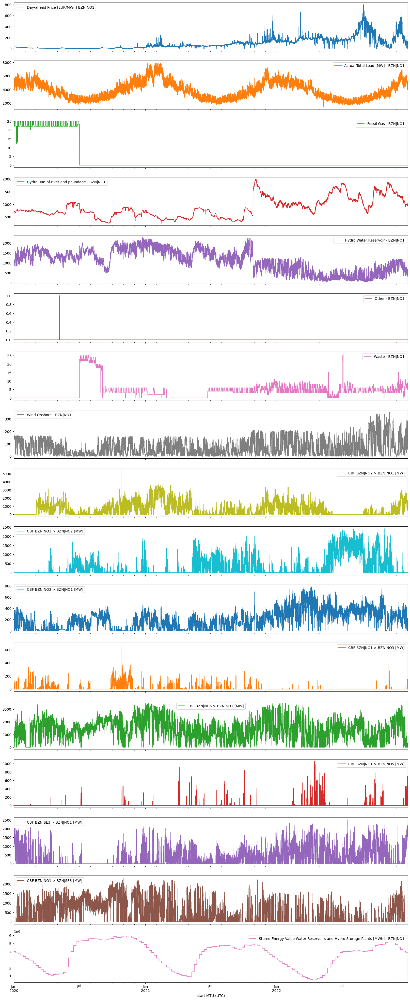

In [50]:
no1 = [col_name for col_name in df.columns if 'NO1' in col_name]
no1.append('start MTU (UTC)')

no1_df = df.loc[:, no1]

no1_df.plot(x='start MTU (UTC)', subplots=True, figsize=(20, 50))

In [51]:
corr = no1_df.corr()
corr.style.background_gradient(cmap='coolwarm', axis=None)

C:\Users\OKEN\AppData\Local\Temp\ipykernel_8988\3957326713.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = no1_df.corr()


,Day-ahead Price [EUR/MWh] BZN|NO1,Actual Total Load [MW] - BZN|NO1,Fossil Gas - BZN|NO1,Hydro Run-of-river and poundage - BZN|NO1,Hydro Water Reservoir - BZN|NO1,Other - BZN|NO1,Waste - BZN|NO1,Wind Onshore - BZN|NO1,CBF BZN|NO2 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|NO2 [MW],CBF BZN|NO3 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|NO3 [MW],CBF BZN|NO5 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|NO5 [MW],CBF BZN|SE3 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|SE3 [MW],Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|NO1
Day-ahead Price [EUR/MWh] BZN|NO1,1.000000,-0.055997,-0.358247,0.427146,-0.576123,-0.024794,0.033479,0.086285,-0.086703,0.286851,0.523659,-0.210843,0.024086,0.024078,0.191673,-0.261462,-0.098036
Actual Total Load [MW] - BZN|NO1,-0.055997,1.000000,0.069383,-0.087875,0.385752,-0.011425,-0.229869,0.092170,0.651447,-0.512491,-0.097790,0.011284,0.449701,-0.084382,-0.062442,0.201185,-0.166151
Fossil Gas - BZN|NO1,-0.358247,0.069383,1.000000,-0.116927,0.201384,0.063967,-0.378944,-0.037374,-0.041327,-0.200117,-0.291500,0.052609,-0.053505,-0.070872,-0.085696,0.154561,-0.278937
Hydro Run-of-river and poundage - BZN|NO1,0.427146,-0.087875,-0.116927,1.000000,-0.518690,-0.014595,0.010671,0.203458,-0.244850,0.440704,0.338137,-0.105669,-0.037368,0.002479,0.140673,-0.201585,0.095035
Hydro Water Reservoir - BZN|NO1,-0.576123,0.385752,0.201384,-0.518690,1.000000,0.011663,-0.059484,-0.252002,0.267414,-0.362147,-0.638491,0.224513,0.398435,-0.187660,-0.473180,0.516766,0.222904
Other - BZN|NO1,-0.024794,-0.011425,0.063967,-0.014595,0.011663,1.000000,-0.025695,-0.017155,0.011493,-0.015931,-0.032102,-0.009280,-0.009871,-0.005002,-0.012260,0.016039,-0.044475
Waste - BZN|NO1,0.033479,-0.229869,-0.378944,0.010671,-0.059484,-0.025695,1.000000,-0.096060,-0.151253,0.053385,0.190241,-0.080049,0.023947,0.036961,-0.034905,0.119939,0.403646
Wind Onshore - BZN|NO1,0.086285,0.092170,-0.037374,0.203458,-0.252002,-0.017155,-0.096060,1.000000,-0.060235,0.084989,0.039430,0.077693,-0.205276,0.002180,0.373459,-0.315788,-0.027535
CBF BZN|NO2 > BZN|NO1 [MW],-0.086703,0.651447,-0.041327,-0.244850,0.267414,0.011493,-0.151253,-0.060235,1.000000,-0.442269,-0.226745,0.139308,0.260021,0.056715,-0.204629,0.401094,-0.199302
CBF BZN|NO1 > BZN|NO2 [MW],0.286851,-0.512491,-0.200117,0.440704,-0.362147,-0.015931,0.053385,0.084989,-0.442269,1.000000,0.277052,-0.132960,-0.068780,-0.071571,0.200310,-0.311376,0.168487


array([<Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>],
      dtype=object)

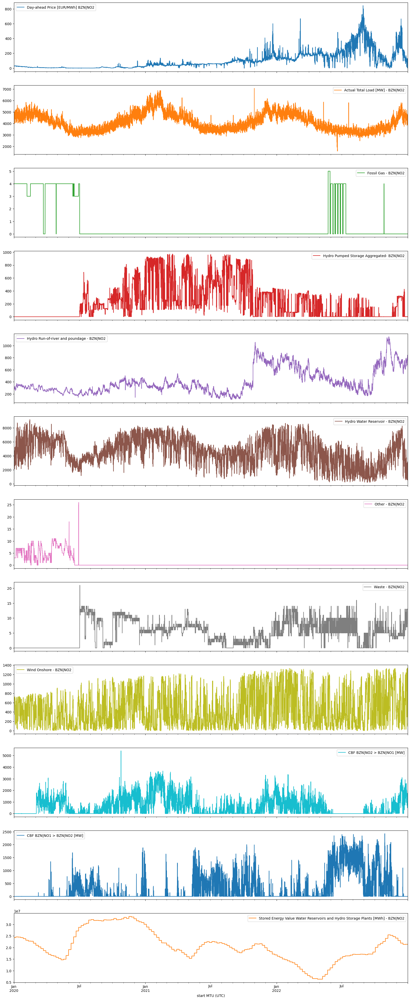

In [52]:
no2 = [col_name for col_name in df.columns if 'NO2' in col_name]
no2.append('start MTU (UTC)')

no2_df = df.loc[:, no2]

no2_df.plot(x='start MTU (UTC)', subplots=True, figsize=(20, 50))

In [54]:
corr = no2_df.corr()
corr.style.background_gradient(cmap='coolwarm', axis=None)

C:\Users\OKEN\AppData\Local\Temp\ipykernel_8988\393346211.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = no2_df.corr()


,Day-ahead Price [EUR/MWh] BZN|NO2,Actual Total Load [MW] - BZN|NO2,Fossil Gas - BZN|NO2,Hydro Pumped Storage Aggregated- BZN|NO2,Hydro Run-of-river and poundage - BZN|NO2,Hydro Water Reservoir - BZN|NO2,Other - BZN|NO2,Waste - BZN|NO2,Wind Onshore - BZN|NO2,CBF BZN|NO2 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|NO2 [MW],Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|NO2
Day-ahead Price [EUR/MWh] BZN|NO2,1.000000,-0.143011,-0.247736,-0.112807,0.258928,-0.222500,-0.289845,-0.034475,0.023721,-0.127042,0.387339,-0.460993
Actual Total Load [MW] - BZN|NO2,-0.143011,1.000000,-0.030648,0.299399,0.289296,0.718260,0.064851,0.026131,0.129610,0.641611,-0.498831,0.042985
Fossil Gas - BZN|NO2,-0.247736,-0.030648,1.000000,-0.406400,-0.266983,0.071495,0.734742,-0.451281,-0.128436,-0.110795,0.004358,-0.123179
Hydro Pumped Storage Aggregated- BZN|NO2,-0.112807,0.299399,-0.406400,1.000000,-0.200946,0.420267,-0.315420,0.040539,-0.165566,0.301933,-0.173087,0.178252
Hydro Run-of-river and poundage - BZN|NO2,0.258928,0.289296,-0.266983,-0.200946,1.000000,0.088739,-0.226481,0.193438,0.296578,0.082865,-0.030707,-0.211266
Hydro Water Reservoir - BZN|NO2,-0.222500,0.718260,0.071495,0.420267,0.088739,1.000000,0.185399,-0.128666,-0.165433,0.461470,-0.457315,0.148901
Other - BZN|NO2,-0.289845,0.064851,0.734742,-0.315420,-0.226481,0.185399,1.000000,-0.469236,-0.113001,-0.000082,-0.193389,-0.068782
Waste - BZN|NO2,-0.034475,0.026131,-0.451281,0.040539,0.193438,-0.128666,-0.469236,1.000000,0.146210,0.157358,0.034068,0.122954
Wind Onshore - BZN|NO2,0.023721,0.129610,-0.128436,-0.165566,0.296578,-0.165433,-0.113001,0.146210,1.000000,0.165126,-0.096206,-0.014952
CBF BZN|NO2 > BZN|NO1 [MW],-0.127042,0.641611,-0.110795,0.301933,0.082865,0.461470,-0.000082,0.157358,0.165126,1.000000,-0.442269,0.066374


array([<Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>], dtype=object)

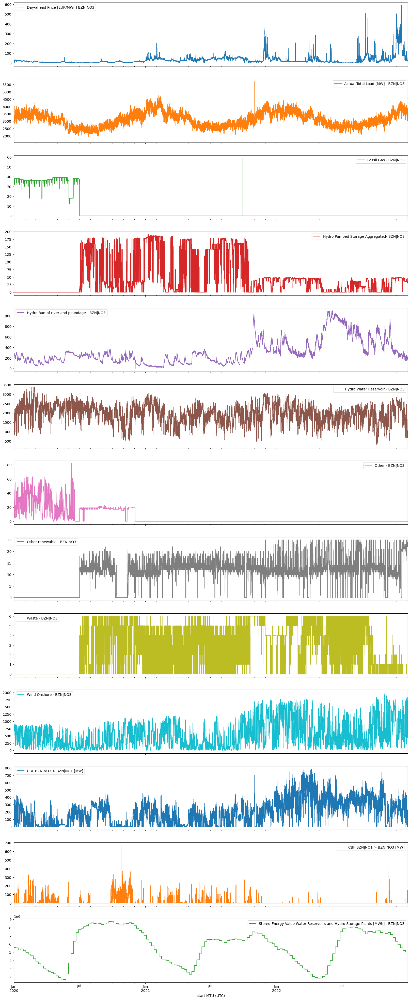

In [55]:
no3 = [col_name for col_name in df.columns if 'NO3' in col_name]
no3.append('start MTU (UTC)')

no3_df = df.loc[:, no3]

no3_df.plot(x='start MTU (UTC)', subplots=True, figsize=(20, 50))

In [56]:
corr = no3_df.corr()
corr.style.background_gradient(cmap='coolwarm', axis=None)

C:\Users\OKEN\AppData\Local\Temp\ipykernel_8988\40387765.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = no3_df.corr()


,Day-ahead Price [EUR/MWh] BZN|NO3,Actual Total Load [MW] - BZN|NO3,Fossil Gas - BZN|NO3,Hydro Pumped Storage Aggregated- BZN|NO3,Hydro Run-of-river and poundage - BZN|NO3,Hydro Water Reservoir - BZN|NO3,Other - BZN|NO3,Other renewable - BZN|NO3,Waste - BZN|NO3,Wind Onshore - BZN|NO3,CBF BZN|NO3 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|NO3 [MW],Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|NO3
Day-ahead Price [EUR/MWh] BZN|NO3,1.000000,0.281263,-0.198209,0.189812,-0.085897,0.256734,-0.246013,0.159567,-0.057530,-0.035673,0.124286,-0.118114,-0.001707
Actual Total Load [MW] - BZN|NO3,0.281263,1.000000,0.030772,0.038015,-0.219660,0.280026,-0.046356,-0.056500,-0.018677,0.288372,-0.015956,-0.018889,-0.272542
Fossil Gas - BZN|NO3,-0.198209,0.030772,1.000000,-0.349494,-0.243108,0.241178,0.627094,-0.713978,-0.476641,-0.154513,-0.288437,0.048790,-0.381141
Hydro Pumped Storage Aggregated- BZN|NO3,0.189812,0.038015,-0.349494,1.000000,-0.402696,0.235077,-0.192890,0.234513,0.080733,-0.269587,-0.059323,-0.101631,0.165221
Hydro Run-of-river and poundage - BZN|NO3,-0.085897,-0.219660,-0.243108,-0.402696,1.000000,-0.171556,-0.277716,0.243286,0.242452,0.206064,0.476953,-0.156147,0.115682
Hydro Water Reservoir - BZN|NO3,0.256734,0.280026,0.241178,0.235077,-0.171556,1.000000,0.126971,-0.224209,0.006579,-0.375515,0.165381,-0.288554,-0.027284
Other - BZN|NO3,-0.246013,-0.046356,0.627094,-0.192890,-0.277716,0.126971,1.000000,-0.530318,-0.267639,-0.117401,-0.305763,0.198939,-0.024041
Other renewable - BZN|NO3,0.159567,-0.056500,-0.713978,0.234513,0.243286,-0.224209,-0.530318,1.000000,0.312117,0.166457,0.301974,-0.153862,0.185182
Waste - BZN|NO3,-0.057530,-0.018677,-0.476641,0.080733,0.242452,0.006579,-0.267639,0.312117,1.000000,0.007468,0.213124,0.003638,0.195665
Wind Onshore - BZN|NO3,-0.035673,0.288372,-0.154513,-0.269587,0.206064,-0.375515,-0.117401,0.166457,0.007468,1.000000,0.255130,-0.052924,-0.012724


array([<Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>], dtype=object)

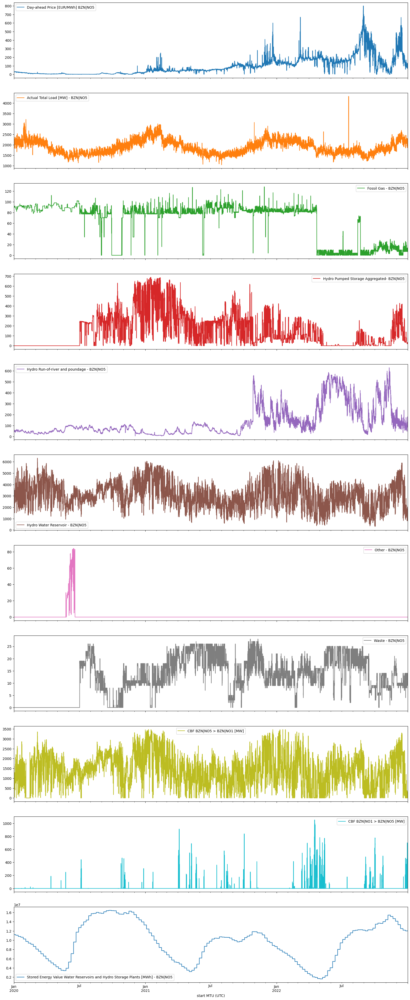

In [57]:
no5 = [col_name for col_name in df.columns if 'NO5' in col_name]
no5.append('start MTU (UTC)')

no5_df = df.loc[:, no5]

no5_df.plot(x='start MTU (UTC)', subplots=True, figsize=(20, 50))

In [58]:
corr = no5_df.corr()
corr.style.background_gradient(cmap='coolwarm', axis=None)

C:\Users\OKEN\AppData\Local\Temp\ipykernel_8988\2510198889.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = no5_df.corr()


,Day-ahead Price [EUR/MWh] BZN|NO5,Actual Total Load [MW] - BZN|NO5,Fossil Gas - BZN|NO5,Hydro Pumped Storage Aggregated- BZN|NO5,Hydro Run-of-river and poundage - BZN|NO5,Hydro Water Reservoir - BZN|NO5,Other - BZN|NO5,Waste - BZN|NO5,CBF BZN|NO5 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|NO5 [MW],Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|NO5
Day-ahead Price [EUR/MWh] BZN|NO5,1.000000,-0.008035,-0.508122,-0.114065,0.344486,-0.039625,-0.121369,0.255292,0.019372,0.029394,-0.068775
Actual Total Load [MW] - BZN|NO5,-0.008035,1.000000,0.191599,0.381171,-0.153673,0.609012,-0.172696,-0.199166,0.470766,-0.076433,-0.007214
Fossil Gas - BZN|NO5,-0.508122,0.191599,1.000000,0.213471,-0.573550,0.147394,0.096253,-0.142140,0.075617,-0.067952,-0.195489
Hydro Pumped Storage Aggregated- BZN|NO5,-0.114065,0.381171,0.213471,1.000000,-0.398298,0.472210,-0.124268,0.109336,0.534439,-0.099628,0.198750
Hydro Run-of-river and poundage - BZN|NO5,0.344486,-0.153673,-0.573550,-0.398298,1.000000,-0.135146,-0.038527,0.285504,-0.059058,-0.008035,-0.062217
Hydro Water Reservoir - BZN|NO5,-0.039625,0.609012,0.147394,0.472210,-0.135146,1.000000,-0.056354,-0.259514,0.927607,-0.321302,0.151555
Other - BZN|NO5,-0.121369,-0.172696,0.096253,-0.124268,-0.038527,-0.056354,1.000000,-0.202187,-0.045275,-0.022778,-0.100658
Waste - BZN|NO5,0.255292,-0.199166,-0.142140,0.109336,0.285504,-0.259514,-0.202187,1.000000,-0.161128,0.075392,-0.088817
CBF BZN|NO5 > BZN|NO1 [MW],0.019372,0.470766,0.075617,0.534439,-0.059058,0.927607,-0.045275,-0.161128,1.000000,-0.289592,0.210668
CBF BZN|NO1 > BZN|NO5 [MW],0.029394,-0.076433,-0.067952,-0.099628,-0.008035,-0.321302,-0.022778,0.075392,-0.289592,1.000000,-0.147069


array([<Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>, <Axes: xlabel='start MTU (UTC)'>,
       <Axes: xlabel='start MTU (UTC)'>], dtype=object)

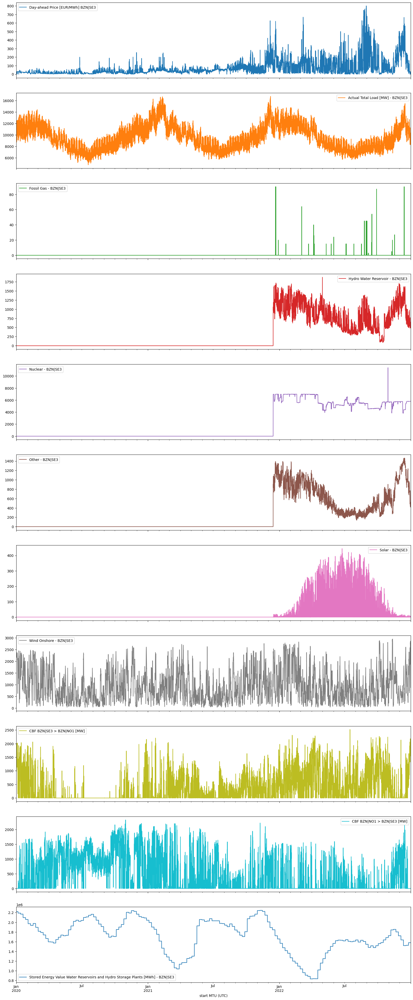

In [62]:
se3 = [col_name for col_name in df.columns if 'SE3' in col_name]
se3.append('start MTU (UTC)')

se3_df = df.loc[:, se3]

se3_df.plot(x='start MTU (UTC)', subplots=True, figsize=(20, 50))

In [60]:
corr = se3_df.corr()
corr.style.background_gradient(cmap='coolwarm', axis=None)

C:\Users\OKEN\AppData\Local\Temp\ipykernel_8988\4143294706.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = se3_df.corr()


,Day-ahead Price [EUR/MWh] BZN|SE3,Actual Total Load [MW] - BZN|SE3,Fossil Gas - BZN|SE3,Hydro Water Reservoir - BZN|SE3,Nuclear - BZN|SE3,Other - BZN|SE3,Solar - BZN|SE3,Wind Onshore - BZN|SE3,CBF BZN|SE3 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|SE3 [MW],Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|SE3
Day-ahead Price [EUR/MWh] BZN|SE3,1.000000,0.229154,0.233318,0.600482,0.429634,0.494157,0.274964,-0.263369,-0.126788,0.014881,-0.196188
Actual Total Load [MW] - BZN|SE3,0.229154,1.000000,0.063945,0.194823,0.027785,0.253507,-0.118164,0.162804,-0.108324,0.201938,-0.167473
Fossil Gas - BZN|SE3,0.233318,0.063945,1.000000,0.123459,0.073640,0.106856,0.023357,-0.032254,-0.022202,0.029684,-0.016265
Hydro Water Reservoir - BZN|SE3,0.600482,0.194823,0.123459,1.000000,0.899661,0.939907,0.322014,0.018879,0.193307,-0.217831,-0.536869
Nuclear - BZN|SE3,0.429634,0.027785,0.073640,0.899661,1.000000,0.874558,0.377730,0.070804,0.369231,-0.346294,-0.581785
Other - BZN|SE3,0.494157,0.253507,0.106856,0.939907,0.874558,1.000000,0.224475,0.074505,0.245897,-0.214577,-0.537424
Solar - BZN|SE3,0.274964,-0.118164,0.023357,0.322014,0.377730,0.224475,1.000000,-0.123301,0.156998,-0.166472,-0.242907
Wind Onshore - BZN|SE3,-0.263369,0.162804,-0.032254,0.018879,0.070804,0.074505,-0.123301,1.000000,0.396304,-0.334559,-0.053700
CBF BZN|SE3 > BZN|NO1 [MW],-0.126788,-0.108324,-0.022202,0.193307,0.369231,0.245897,0.156998,0.396304,1.000000,-0.547191,-0.319183
CBF BZN|NO1 > BZN|SE3 [MW],0.014881,0.201938,0.029684,-0.217831,-0.346294,-0.214577,-0.166472,-0.334559,-0.547191,1.000000,0.259158
